# Clasificador de Anillos Galácticos — Zoobot v8 Combined
## Subclasificación: `inner` · `outer` · `inner+outer`

### Datasets combinados:
- **dataset.csv** — galaxias SDSS vía Legacy Survey DR10 (~1 329 anillos)
- **MaNGA_rings.csv** — galaxias MaNGA vía Legacy Survey DR9 (680 anillos)
- **Total combinado: ~2 009 galaxias con anillo** (sin incluir clase `none`)

### Pipeline:
1. Cargar ambos catálogos y unificar formato → lookup `id → ring_type`
2. Procesar FITS existentes (SDSS GRZ + MaNGA GRZ) → PNG por clase
3. Split estratificado train / val (80/20)
4. `GalaxyDataset` con oversample por clase (balanceo interno)
5. Fine-tuning progresivo Zoobot ConvNeXt-Nano · 3 fases · FocalLoss
6. Evaluación completa: CM, classification report, Grad-CAM, detección de anillos


---
# Parte 1: Instalación y configuración

> Ejecutar solo la primera vez. Después de instalar Zoobot, **reinstalar PyTorch con CUDA**.

In [1]:
'''
# ============================================================
# Instalación de dependencias
# ============================================================
!pip install zoobot
!pip install torch torchvision --index-url https://download.pytorch.org/whl/cu126
!pip install timm plotly nbformat opencv-python-headless pytorch-grad-cam

import torch
print(f"PyTorch: {torch.__version__}")
print(f"CUDA disponible: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
'''
print("Celda de instalación (descomenta para ejecutar)")

Celda de instalación (descomenta para ejecutar)


---
# Parte 2: Imports globales

In [2]:
import os, io, re, cv2, time, glob, shutil, random, pathlib, warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
from collections import defaultdict
from concurrent.futures import ThreadPoolExecutor, as_completed

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms

from astropy.io import fits
from astropy.visualization import make_lupton_rgb, ZScaleInterval, MinMaxInterval, LogStretch

from scipy import ndimage
from scipy.signal import find_peaks, savgol_filter
from skimage.filters import gaussian, threshold_otsu
from skimage.measure import label, regionprops
from skimage.morphology import binary_closing, binary_dilation, binary_erosion, binary_opening, disk

from sklearn.metrics import (
    classification_report, confusion_matrix, f1_score,
    precision_recall_curve, roc_auc_score
)

import matplotlib.patches as mpatches
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from matplotlib.patches import Ellipse

import timm
import requests

warnings.filterwarnings('ignore')
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.facecolor'] = 'white'
print("Imports completados exitosamente")

Imports completados exitosamente


---
# Parte 3: Configuración global

> **⚠️ ADAPTAR:** Modifica las rutas según tu entorno.
>
> - `CSV_SDSS` → dataset.csv (SDSS, con columnas `objID, ra, dec, anillos`)
> - `CSV_MANGA` → MaNGA_rings.csv (columnas `name, anillos, objra, objdec`)
> - `FITS_DR10_DIR` → carpeta con `<objID>_grz.fits` (Legacy Survey DR10)
> - `FITS_DR9_DIR` → carpeta con `<safe_name>_grz.fits` (Legacy Survey DR9 / MaNGA)


In [3]:
# ============================================================
# RUTAS DE ENTRADA — ADAPTAR AQUÍ
# ============================================================
CSV_SDSS         = "../Data/dataset.csv"        # SDSS (objID, ra, dec, anillos)
CSV_MANGA        = "../Data/MaNGA_rings.csv"    # MaNGA (name, anillos, objra, objdec)

# Carpetas de FITS locales ya descargados
FITS_DR10_DIR    = Path("../Images/Images_GRZ")           # SDSS → <objID>_grz.fits
FITS_DR9_DIR     = Path("../Images/MaNGA_FITS_GRZ")       # MaNGA → <safe_name>_grz.fits

# Salidas
DATA_DIR         = Path("./galaxy_images_combined")   # PNGs organizados por clase
OUTPUT_DIR       = Path("./outputs")
DATASET_NAME     = "dataset_combined_rings_3cls"      # Carpeta train/val

# ============================================================
# PARÁMETROS
# ============================================================
PIXSCALE   = 0.262          # arcsec/pixel (Legacy Survey)
SIZE       = 224
BANDS      = "grz"
TRANSFORM  = "rgi_lognorm"

# Clases
RING_CODES = {4: "inner", 8: "outer", 12: "inner+outer"}
RING_TYPE  = ["inner", "outer", "inner+outer"]
VALID_CODES = {4, 8, 12}

# Entrenamiento
IMAGE_SIZE = 224
SEED       = 42
DEVICE     = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Crear directorios
for d in [DATA_DIR, OUTPUT_DIR]:
    d.mkdir(parents=True, exist_ok=True)
for cls_name in RING_TYPE:
    (DATA_DIR / cls_name).mkdir(parents=True, exist_ok=True)

print(f"Device: {DEVICE}")
print(f"Clases: {RING_TYPE}")
print(f"FITS DR10 dir: {FITS_DR10_DIR}")
print(f"FITS DR9  dir: {FITS_DR9_DIR}")

Device: cuda
Clases: ['inner', 'outer', 'inner+outer']
FITS DR10 dir: ..\Images\Images_GRZ
FITS DR9  dir: ..\Images\MaNGA_FITS_GRZ


---
# Parte 4: Funciones auxiliares

## 4.1 Utilidades generales

In [4]:
def to_int(x, default=0):
    try: return int(float(x))
    except: return default

def safe_name(s):
    """Convierte nombre MaNGA (manga-XXXX-YYYY) a string seguro para archivo."""
    return re.sub(r'[^\w\-]', '_', str(s))

def legacy_cutout_url(ra, dec, pixscale=PIXSCALE, size=SIZE, bands=BANDS, layer="ls-dr10"):
    return (f"https://www.legacysurvey.org/viewer/fits-cutout"
            f"?ra={ra}&dec={dec}&layer={layer}"
            f"&pixscale={pixscale}&size={size}&bands={bands}")

print("Utilidades cargadas")

Utilidades cargadas


## 4.2 Transformaciones FITS → RGB

Se implementan múltiples transformaciones para las imágenes de 3 bandas (g, r, z).
La transformación por defecto es `rgi_lognorm`, que aplica normalización logarítmica
suave por banda para realzar estructuras débiles como los anillos galácticos.

In [5]:
class Transformations:
    @staticmethod
    def log_n_scale_transform(img_data, log_a=1000):
        if img_data is None or img_data.size == 0: return None
        img = img_data.astype(np.float64)
        vmin, vmax = np.nanpercentile(img, [0.5, 99.5])
        img = np.clip(img, vmin, vmax)
        if vmax > vmin: img = (img - vmin) / (vmax - vmin)
        img = np.log10(1 + log_a * img) / np.log10(1 + log_a)
        return np.clip(img * 255, 0, 255).astype(np.uint8)

    @staticmethod
    def rgi_lognorm_transform(r, g, z, log_a=1000):
        channels = []
        for band in [r, g, z]:
            ch = Transformations.log_n_scale_transform(band, log_a=log_a)
            if ch is None: return None
            channels.append(ch)
        return np.stack(channels, axis=-1)

    @staticmethod
    def rgi_stack_transform(r, g, z):
        channels = []
        for band in [r, g, z]:
            b = band.astype(np.float64)
            p1, p99 = np.nanpercentile(b, [1, 99])
            b = np.clip(b, p1, p99)
            b = (b - p1) / max(p99 - p1, 1e-10)
            channels.append((b * 255).astype(np.uint8))
        return np.stack(channels, axis=-1)

    @staticmethod
    def unsharp_transform(r, g, z, sigma=5, strength=2.0):
        channels = []
        for band in [r, g, z]:
            b = band.astype(np.float64)
            p1, p99 = np.nanpercentile(b, [1, 99])
            b = np.clip(b, p1, p99)
            b = (b - p1) / max(p99 - p1, 1e-10)
            blurred = gaussian(b, sigma=sigma)
            sharp = np.clip(b + strength * (b - blurred), 0, 1)
            channels.append((sharp * 255).astype(np.uint8))
        return np.stack(channels, axis=-1)

    @staticmethod
    def pca_transform(r, g, z):
        bands = np.stack([r.flatten(), g.flatten(), z.flatten()], axis=1).astype(np.float64)
        bands -= bands.mean(axis=0)
        _, eigenvectors = np.linalg.eigh(np.cov(bands, rowvar=False))
        pca = bands @ eigenvectors[:, ::-1]
        channels = []
        for i in range(3):
            ch = pca[:, i].reshape(r.shape)
            p1, p99 = np.nanpercentile(ch, [1, 99])
            ch = np.clip(ch, p1, p99)
            ch = (ch - p1) / max(p99 - p1, 1e-10)
            channels.append((ch * 255).astype(np.uint8))
        return np.stack(channels, axis=-1)

    @staticmethod
    def apply_transform(r_band, g_band, z_band, method="rgi_lognorm"):
        methods = {
            "rgi_stack":   lambda: Transformations.rgi_stack_transform(r_band, g_band, z_band),
            "rgi_lognorm": lambda: Transformations.rgi_lognorm_transform(r_band, g_band, z_band),
            "unsharp":     lambda: Transformations.unsharp_transform(r_band, g_band, z_band),
            "pca":         lambda: Transformations.pca_transform(r_band, g_band, z_band),
        }
        if method not in methods:
            method = "rgi_lognorm"
        try: return methods[method]()
        except Exception as e:
            print(f"Error en transformación {method}: {e}")
            return None

print("Transformaciones cargadas")

Transformaciones cargadas


---
# Parte 5: Carga y unificación de catálogos

## 5.1 Parsear ambos CSVs y construir lookups

Se cargan los dos catálogos independientemente y se construyen dos lookups:
- `sdss_id_to_class`: `objID (int64) → ring_type`
- `manga_name_to_class`: `safe_name (str) → ring_type`

Ambos se usarán para procesar sus respectivos FITS sin mezclar identificadores.

In [6]:
# ============================================================
# Catálogo SDSS (dataset.csv)
# ============================================================
df_sdss = pd.read_csv(CSV_SDSS)
df_sdss['objID'] = df_sdss['objID'].astype(np.int64)
df_sdss['anillos_int'] = df_sdss['anillos'].apply(lambda x: to_int(x, -1))
df_sdss_rings = df_sdss[df_sdss['anillos_int'].isin(VALID_CODES)].copy()
df_sdss_rings['ring_type'] = df_sdss_rings['anillos_int'].map(RING_CODES)
sdss_id_to_class = dict(zip(df_sdss_rings['objID'], df_sdss_rings['ring_type']))

print(f"=== SDSS (dataset.csv) ===")
print(f"Total: {len(df_sdss)} | Con anillo: {len(df_sdss_rings)}")
print(df_sdss_rings['ring_type'].value_counts().to_string())

# ============================================================
# Catálogo MaNGA (MaNGA_rings.csv)
# ============================================================
df_manga = pd.read_csv(CSV_MANGA)
df_manga['anillos_int'] = df_manga['anillos'].apply(lambda x: to_int(x, -1))
df_manga_rings = df_manga[df_manga['anillos_int'].isin(VALID_CODES)].copy()
df_manga_rings['ring_type'] = df_manga_rings['anillos_int'].map(RING_CODES)
df_manga_rings['safe_name'] = df_manga_rings['name'].apply(safe_name)
manga_name_to_class = dict(zip(df_manga_rings['safe_name'], df_manga_rings['ring_type']))

print(f"\n=== MaNGA (MaNGA_rings.csv) ===")
print(f"Total: {len(df_manga)} | Con anillo: {len(df_manga_rings)}")
print(df_manga_rings['ring_type'].value_counts().to_string())

# ============================================================
# Resumen combinado
# ============================================================
total_by_class = defaultdict(int)
for rt in df_sdss_rings['ring_type']: total_by_class[rt] += 1
for rt in df_manga_rings['ring_type']: total_by_class[rt] += 1

print(f"\n=== TOTAL COMBINADO ===")
grand_total = 0
for cls in RING_TYPE:
    n = total_by_class[cls]
    grand_total += n
    print(f"  {cls:15s}: {n}")
print(f"  {'TOTAL':15s}: {grand_total}")

=== SDSS (dataset.csv) ===
Total: 8528 | Con anillo: 1415
ring_type
inner          857
inner+outer    372
outer          186

=== MaNGA (MaNGA_rings.csv) ===
Total: 680 | Con anillo: 680
ring_type
inner          459
outer          161
inner+outer     60

=== TOTAL COMBINADO ===
  inner          : 1316
  outer          : 347
  inner+outer    : 432
  TOTAL          : 2095


---
# Parte 6: Procesado FITS → PNG

## 6.1 Procesar FITS SDSS (DR10) → PNG por clase

Lee archivos `<objID>_grz.fits` de `FITS_DR10_DIR`, aplica `rgi_lognorm` y guarda
en `DATA_DIR/<ring_type>/<objID>_<ring_type>.png`.

In [7]:
def process_fits_folder(fits_dir, id_to_class_fn, id_extractor_fn,
                         data_dir, transform=TRANSFORM, image_size=IMAGE_SIZE,
                         source_tag=""):
    """
    Procesa todos los *_grz.fits de fits_dir.
    id_extractor_fn(stem) -> id_key usado para lookup
    id_to_class_fn(id_key) -> ring_type o None
    """
    fits_files = sorted(Path(fits_dir).glob("*_grz.fits"))
    print(f"FITS en {fits_dir}: {len(fits_files)} [{source_tag}]")
    if not fits_files:
        print(f"  ⚠️  No se encontraron archivos — verifica la ruta: {Path(fits_dir).resolve()}")
        return

    processed = skipped_no_class = skipped_exists = errors = 0

    for fits_path in fits_files:
        try:
            id_key = id_extractor_fn(fits_path.stem)
            ring_class = id_to_class_fn(id_key)
            if ring_class is None:
                skipped_no_class += 1
                continue

            safe_stem = str(id_key).replace('+', 'plus')  # seguridad en nombres
            dest_png = Path(data_dir) / ring_class / f"{safe_stem}_{ring_class}.png"

            if dest_png.exists() and dest_png.stat().st_size > 0:
                skipped_exists += 1
                processed += 1
                continue

            with fits.open(fits_path) as hdul:
                data = hdul[0].data
                if data is None or data.ndim < 3:
                    errors += 1
                    continue
                g_band, r_band, z_band = data[0], data[1], data[2]
                img = Transformations.apply_transform(r_band, g_band, z_band, transform)

            if img is not None:
                pil_img = Image.fromarray(img)
                if pil_img.size != (image_size, image_size):
                    pil_img = pil_img.resize((image_size, image_size), Image.LANCZOS)
                pil_img.save(dest_png)
                processed += 1
            else:
                errors += 1

        except Exception as e:
            errors += 1
            if errors <= 5:
                print(f"  Error en {fits_path.name}: {e}")

    print(f"  Procesados: {processed} ({skipped_exists} ya existían) | "
          f"Sin clase: {skipped_no_class} | Errores: {errors}")


# --- Procesar FITS SDSS ---
def sdss_id_extractor(stem):
    """stem = '<objID>_grz' → int(objID)"""
    try: return int(stem.replace("_grz", ""))
    except: return None

def sdss_lookup(id_key):
    return sdss_id_to_class.get(id_key, None)

process_fits_folder(
    FITS_DR10_DIR, sdss_lookup, sdss_id_extractor,
    DATA_DIR, source_tag="SDSS DR10"
)

FITS en ..\Images\Images_GRZ: 7678 [SDSS DR10]
  Procesados: 1329 (1329 ya existían) | Sin clase: 6349 | Errores: 0


## 6.2 Procesar FITS MaNGA (DR9) → PNG por clase

Lee archivos `<safe_name>_grz.fits` de `FITS_DR9_DIR` y los vuelca a la misma
carpeta `DATA_DIR` para formar un dataset unificado.

In [8]:
# --- Procesar FITS MaNGA ---
def manga_id_extractor(stem):
    """stem = '<safe_name>_grz' → safe_name str"""
    return stem.replace("_grz", "")

def manga_lookup(id_key):
    return manga_name_to_class.get(id_key, None)

process_fits_folder(
    FITS_DR9_DIR, manga_lookup, manga_id_extractor,
    DATA_DIR, source_tag="MaNGA DR9"
)

# --- Resumen final de imágenes en disco ---
print("\n=== PNGs generados en DATA_DIR ===")
total_imgs = 0
for cls_name in RING_TYPE:
    n = len(list((DATA_DIR / cls_name).glob("*.png")))
    total_imgs += n
    print(f"  {cls_name:15s}: {n}")
print(f"  {'TOTAL':15s}: {total_imgs}")

FITS en ..\Images\MaNGA_FITS_GRZ: 680 [MaNGA DR9]
  Procesados: 680 (680 ya existían) | Sin clase: 0 | Errores: 0

=== PNGs generados en DATA_DIR ===
  inner          : 1263
  outer          : 339
  inner+outer    : 407
  TOTAL          : 2009


---
# Parte 7: Análisis Exploratorio (EDA)

## 7.1 Distribución de clases y visualización de muestras

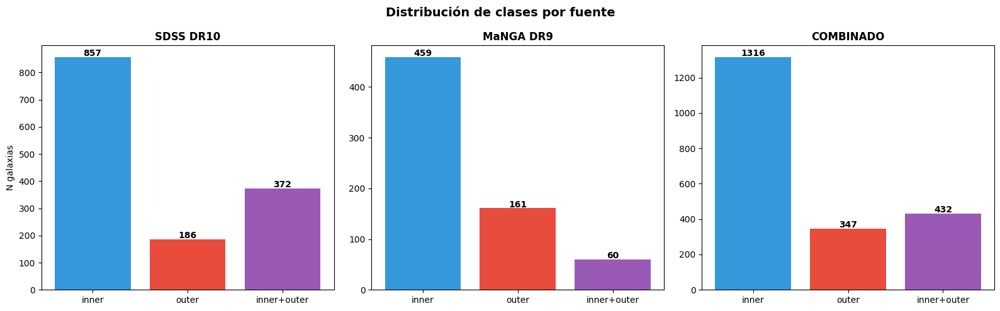

             SDSS  MaNGA  Total
inner         857    459   1316
outer         186    161    347
inner+outer   372     60    432


In [9]:
# Distribución por fuente y clase
sdss_counts = df_sdss_rings['ring_type'].value_counts()
manga_counts = df_manga_rings['ring_type'].value_counts()

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

# SDSS
colors_cls = ['#3498db', '#e74c3c', '#9b59b6']
sdss_vals = [sdss_counts.get(c, 0) for c in RING_TYPE]
manga_vals = [manga_counts.get(c, 0) for c in RING_TYPE]
combined_vals = [s + m for s, m in zip(sdss_vals, manga_vals)]

axes[0].bar(RING_TYPE, sdss_vals, color=colors_cls)
axes[0].set_title('SDSS DR10', fontweight='bold')
axes[0].set_ylabel('N galaxias')
for i, v in enumerate(sdss_vals): axes[0].text(i, v+5, str(v), ha='center', fontweight='bold')

axes[1].bar(RING_TYPE, manga_vals, color=colors_cls)
axes[1].set_title('MaNGA DR9', fontweight='bold')
for i, v in enumerate(manga_vals): axes[1].text(i, v+2, str(v), ha='center', fontweight='bold')

axes[2].bar(RING_TYPE, combined_vals, color=colors_cls)
axes[2].set_title('COMBINADO', fontweight='bold')
for i, v in enumerate(combined_vals): axes[2].text(i, v+5, str(v), ha='center', fontweight='bold')

plt.suptitle('Distribución de clases por fuente', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Tabla resumen
summary = pd.DataFrame({
    'SDSS': sdss_vals,
    'MaNGA': manga_vals,
    'Total': combined_vals
}, index=RING_TYPE)
print(summary.to_string())

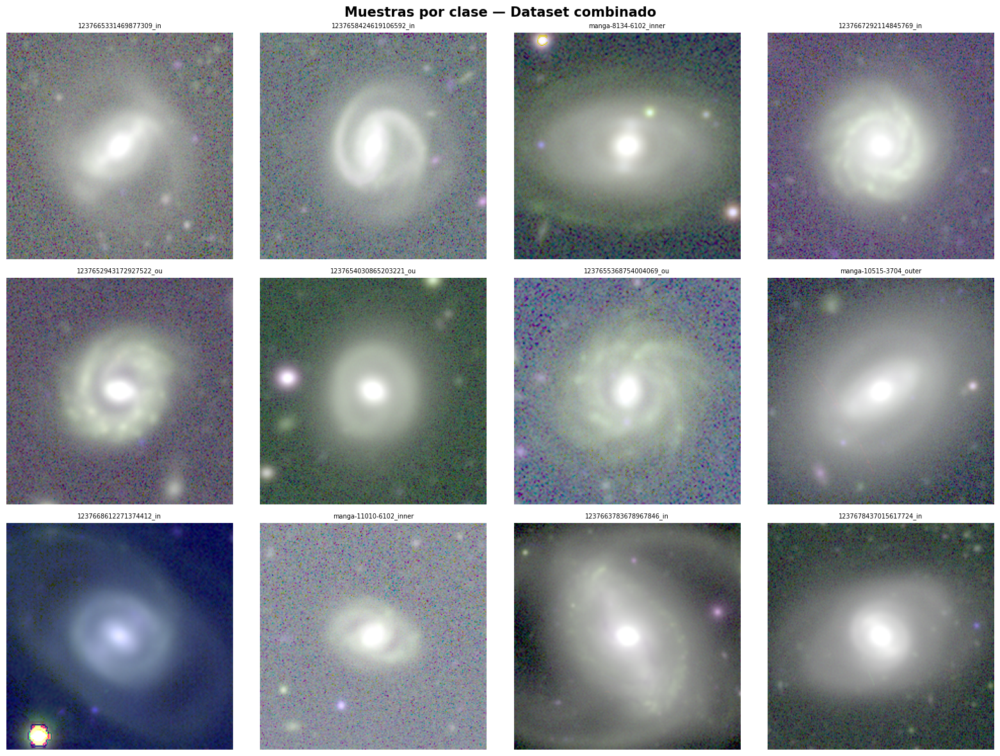

In [10]:
# Visualizar muestras de cada clase
def plot_samples_by_class(data_dir, ring_types, samples_per_class=4):
    fig, axs = plt.subplots(len(ring_types), samples_per_class,
                             figsize=(4*samples_per_class, 4*len(ring_types)))
    for i, cls in enumerate(ring_types):
        cls_dir = Path(data_dir) / cls
        imgs = list(cls_dir.glob("*.png"))
        if not imgs: continue
        samples = random.sample(imgs, min(samples_per_class, len(imgs)))
        for j, img_path in enumerate(samples):
            axs[i, j].imshow(Image.open(img_path))
            axs[i, j].axis('off')
            if j == 0:
                axs[i, j].set_ylabel(cls, fontsize=14, fontweight='bold',
                                     rotation=0, labelpad=60, va='center')
            axs[i, j].set_title(img_path.stem[:22], fontsize=7)
    plt.suptitle('Muestras por clase — Dataset combinado', fontsize=15, fontweight='bold')
    plt.tight_layout()
    plt.show()

plot_samples_by_class(DATA_DIR, RING_TYPE)

---
# Parte 8: Preparación del dataset para entrenamiento

## 8.1 Split estratificado train / val

Se realiza un split 80/20 **manteniendo proporción por clase** (estratificado).
No se aplica sub-sampleo — el desbalanceo se maneja con `GalaxyDataset(balance=True)`
y `FocalLoss` con pesos de clase.

In [11]:
def create_dataset_folders(base_path, categories):
    base_path = Path(base_path)
    for split in ['train', 'val']:
        for cat in categories:
            (base_path / split / cat).mkdir(parents=True, exist_ok=True)

def split_dataset(source_dir, dest_base, categories, val_fraction=0.2, seed=42):
    random.seed(seed); np.random.seed(seed)
    create_dataset_folders(dest_base, categories)
    print("Creando split train/val con TODOS los datos combinados...")
    for cat in categories:
        src = Path(source_dir) / cat
        imgs = sorted(src.glob("*.png"))
        random.shuffle(imgs)
        n_val = max(10, int(len(imgs) * val_fraction))
        val_imgs, train_imgs = imgs[:n_val], imgs[n_val:]
        for img in train_imgs:
            shutil.copy2(img, Path(dest_base) / "train" / cat / img.name)
        for img in val_imgs:
            shutil.copy2(img, Path(dest_base) / "val" / cat / img.name)
        print(f"  {cat:15s}: {len(train_imgs):4d} train | {len(val_imgs):4d} val")

if Path(DATASET_NAME).exists():
    shutil.rmtree(DATASET_NAME)
split_dataset(DATA_DIR, DATASET_NAME, RING_TYPE)

Creando split train/val con TODOS los datos combinados...
  inner          : 1011 train |  252 val
  outer          :  272 train |   67 val
  inner+outer    :  326 train |   81 val


## 8.2 GalaxyDataset con oversample y augmentation

In [12]:
class GalaxyDataset(Dataset):
    """
    Dataset con balance opcional por oversample de clases minoritarias.
    En train: se replica aleatoriamente hasta alcanzar la clase mayoritaria.
    En val:   sin balance para evaluar en distribución real.
    """
    def __init__(self, root_dir, categories, transform=None, balance=True, target_count=None):
        self.root_dir = Path(root_dir)
        self.transform = transform
        self.samples, self.labels = [], []
        self.class_to_idx = {cat: i for i, cat in enumerate(categories)}
        self.idx_to_class = {i: cat for cat, i in self.class_to_idx.items()}
        class_files = {cat: list(self.root_dir.glob(f"{cat}/*.png")) for cat in categories}
        if balance:
            if target_count is None:
                target_count = max(len(f) for f in class_files.values())
            for cat, files in class_files.items():
                if len(files) < target_count:
                    extra = list(np.random.choice(files, target_count - len(files), replace=True))
                    files = files + extra
                self.samples.extend(files)
                self.labels.extend([self.class_to_idx[cat]] * len(files))
        else:
            for cat, files in class_files.items():
                self.samples.extend(files)
                self.labels.extend([self.class_to_idx[cat]] * len(files))

    def __len__(self): return len(self.samples)

    def __getitem__(self, idx):
        img = Image.open(self.samples[idx]).convert("RGB")
        if self.transform: img = self.transform(img)
        return img, self.labels[idx]

    def __repr__(self):
        counts = defaultdict(int)
        for lbl in self.labels: counts[self.idx_to_class[lbl]] += 1
        return f"GalaxyDataset({len(self)} samples: {dict(counts)})"

print("GalaxyDataset definido")

GalaxyDataset definido


## 8.3 Transformaciones y DataLoaders

In [13]:
# Augmentation robusta para entrenamiento
# Las galaxias son simétricas → flip + rotación completa es correcto.
# ColorJitter suave para no destruir la señal fotométrica.
train_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(180, fill=0),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05), scale=(0.9, 1.1), fill=0),
    transforms.RandomApply([transforms.GaussianBlur(kernel_size=5)], p=0.3),
    transforms.ColorJitter(brightness=0.15, contrast=0.15),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.2, scale=(0.02, 0.12)),
])

val_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

train_dataset = GalaxyDataset(f'{DATASET_NAME}/train', RING_TYPE, transform=train_transform, balance=True)
val_dataset   = GalaxyDataset(f'{DATASET_NAME}/val',   RING_TYPE, transform=val_transform,   balance=False)

train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True,  num_workers=0, drop_last=True)
val_dataloader   = DataLoader(val_dataset,   batch_size=32, shuffle=False, num_workers=0)

print("Train:", train_dataset)
print("Val:  ", val_dataset)

Train: GalaxyDataset(3033 samples: {'inner': 1011, 'outer': 1011, 'inner+outer': 1011})
Val:   GalaxyDataset(400 samples: {'inner': 252, 'outer': 67, 'inner+outer': 81})


---
# Parte 9: Fine-tuning de Zoobot

## 9.1 FocalLoss con label smoothing

FocalLoss reduce el peso de ejemplos fáciles y focaliza el entrenamiento en los
casos difíciles (outer y inner+outer). `label_smoothing=0.05` regulariza la confianza.
Los `alpha` (pesos por clase) se calculan automáticamente desde la distribución del loader.

In [14]:
class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2.0, label_smoothing=0.05):
        super().__init__()
        self.gamma = gamma
        self.alpha = alpha
        self.label_smoothing = label_smoothing

    def forward(self, inputs, targets):
        n_classes = inputs.size(1)
        smooth = torch.zeros_like(inputs).scatter_(1, targets.unsqueeze(1), 1.0)
        smooth = smooth * (1 - self.label_smoothing) + self.label_smoothing / n_classes
        log_probs = F.log_softmax(inputs, dim=1)
        probs     = torch.exp(log_probs)
        focal_weight = (1 - probs) ** self.gamma
        loss = -focal_weight * smooth * log_probs
        if self.alpha is not None:
            loss = loss * self.alpha.to(inputs.device).unsqueeze(0)
        return loss.sum(dim=1).mean()

print("FocalLoss definido")

FocalLoss definido


## 9.2 ZoobotRingSubclassifier (ConvNeXt-Nano backbone)

Encoder preentrenado de Zoobot (Galaxy Zoo) + head personalizado de 2 capas:
```
BatchNorm → Dropout(0.4) → Linear(640→128) → GELU → BatchNorm → Dropout(0.2) → Linear(128→3)
```

El método `set_phase` controla el descongelado progresivo del encoder:
- **Phase 1**: Solo head (~84k params)
- **Phase 2**: Head + últimas 2 capas del encoder
- **Phase 3**: Todo el encoder (fine-tuning completo)

In [15]:
class ZoobotRingSubclassifier(nn.Module):
    def __init__(self, n_classes=3, dropout=0.4,
                 encoder_name='hf_hub:mwalmsley/zoobot-encoder-convnext_nano'):
        super().__init__()
        self.device = DEVICE
        self.ring_type = RING_TYPE
        self.n_classes = n_classes
        print(f'Cargando encoder: {encoder_name}')
        self.encoder = timm.create_model(encoder_name, pretrained=True, num_classes=0)
        with torch.no_grad():
            dummy = torch.randn(1, 3, IMAGE_SIZE, IMAGE_SIZE)
            encoder_dim = self.encoder(dummy).shape[-1]
        print(f'Encoder dim: {encoder_dim}')
        self.head = nn.Sequential(
            nn.BatchNorm1d(encoder_dim), nn.Dropout(p=dropout),
            nn.Linear(encoder_dim, 128), nn.GELU(),
            nn.BatchNorm1d(128), nn.Dropout(p=dropout * 0.5),
            nn.Linear(128, n_classes),
        )
        for m in self.head.modules():
            if isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight, nonlinearity='relu')
                nn.init.zeros_(m.bias)
        self.criterion = FocalLoss(gamma=2.0, label_smoothing=0.05)
        self.to(self.device)

    def forward(self, x):
        features = self.encoder(x)
        if features.dim() > 2:
            features = F.adaptive_avg_pool2d(features, 1).flatten(1)
        return self.head(features)

    def save_model(self, path):
        torch.save(self.state_dict(), path)
        print(f'Modelo guardado: {path}')

    def load_model(self, path):
        self.load_state_dict(torch.load(path, map_location=self.device, weights_only=True))
        print(f'Modelo cargado: {path}')

    def __str__(self):
        total = sum(p.numel() for p in self.parameters())
        return f'ZoobotRingSubclassifier | Classes: {self.ring_type} | Params: {total:,}'

    def set_phase(self, phase):
        for param in self.parameters(): param.requires_grad = False
        if phase >= 1:
            for param in self.head.parameters(): param.requires_grad = True
        if phase >= 2:
            for child in list(self.encoder.children())[-2:]:
                for param in child.parameters(): param.requires_grad = True
        if phase >= 3:
            for param in self.encoder.parameters(): param.requires_grad = True
        trainable = sum(p.numel() for p in self.parameters() if p.requires_grad)
        total = sum(p.numel() for p in self.parameters())
        print(f'  Phase {phase}: {trainable:,}/{total:,} ({100*trainable/total:.1f}%)')

    def _compute_class_weights(self, loader):
        counts = defaultdict(int)
        for _, labels in loader:
            for l in labels.numpy(): counts[l] += 1
        total = sum(counts.values()); n = len(counts)
        w = torch.zeros(n)
        for idx, count in counts.items(): w[idx] = total / (n * count)
        return w / w.mean()

    def _validate(self, val_loader):
        self.eval()
        all_preds, all_labels = [], []
        running_loss, total = 0.0, 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(self.device), labels.to(self.device)
                outputs = self(images)
                loss = self.criterion(outputs, labels)
                running_loss += loss.item() * images.size(0)
                total += images.size(0)
                _, preds = torch.max(outputs, 1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
        report = classification_report(all_labels, all_preds,
                    target_names=self.ring_type, output_dict=True, zero_division=0)
        return {'loss': running_loss/total, 'acc': report['accuracy'],
                'macro_f1': report['macro avg']['f1-score']}

    def train_model(self, train_loader, val_loader, epochs=15, phase=1, lr=1e-4, patience=10):
        self.to(self.device)
        history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [], 'macro_f1': []}
        print(f'\n{"="*60}')
        print(f' Phase {phase} | {epochs} epochs | LR={lr}')
        print(f'{"="*60}')
        self.set_phase(phase)
        cw = self._compute_class_weights(train_loader)
        self.criterion.alpha = cw
        print(f'  Weights: { {self.ring_type[k]: f"{v:.2f}" for k, v in enumerate(cw.tolist())} }')
        optimizer = torch.optim.Adam(
            filter(lambda p: p.requires_grad, self.parameters()), lr=lr, weight_decay=1e-4)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='max', factor=0.5, patience=4, min_lr=1e-7)
        best_f1, patience_counter = 0.0, 0
        best_path = OUTPUT_DIR / f'best_combined_phase{phase}.pt'
        for epoch in range(epochs):
            self.train()
            running_loss, correct, total = 0.0, 0, 0
            for images, labels in train_loader:
                images, labels = images.to(self.device), labels.to(self.device)
                optimizer.zero_grad()
                outputs = self(images)
                loss = self.criterion(outputs, labels)
                loss.backward()
                torch.nn.utils.clip_grad_norm_(self.parameters(), max_norm=1.0)
                optimizer.step()
                running_loss += loss.item() * images.size(0)
                _, preds = torch.max(outputs, 1)
                correct += (preds == labels).sum().item()
                total += labels.size(0)
            e_loss, e_acc = running_loss/total, correct/total
            history['train_loss'].append(e_loss); history['train_acc'].append(e_acc)
            val_m = self._validate(val_loader)
            history['val_loss'].append(val_m['loss']); history['val_acc'].append(val_m['acc'])
            history['macro_f1'].append(val_m['macro_f1'])
            scheduler.step(val_m['macro_f1'])
            lr_now = optimizer.param_groups[0]['lr']
            mark = ' ✓' if val_m['macro_f1'] > best_f1 else ''
            print(f'  E{epoch+1:02d}/{epochs} | TL {e_loss:.4f} TA {e_acc:.3f} | '
                  f'VL {val_m["loss"]:.4f} VA {val_m["acc"]:.3f} | '
                  f'MF1 {val_m["macro_f1"]:.4f} | lr {lr_now:.2e}{mark}')
            if val_m['macro_f1'] > best_f1:
                best_f1 = val_m['macro_f1']
                self.save_model(str(best_path))
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    print(f'  Early stopping (patience={patience})')
                    break
        print(f'  Mejor MF1 phase {phase}: {best_f1:.4f} → {best_path}')
        return history

    def evaluate(self, val_loader, plot=True):
        self.eval()
        all_preds, all_labels = [], []
        with torch.no_grad():
            for images, labels in val_loader:
                images = images.to(self.device)
                outputs = self(images)
                _, preds = torch.max(outputs, 1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.numpy())
        print('\n' + '='*60)
        print(classification_report(all_labels, all_preds, target_names=self.ring_type))
        report = classification_report(all_labels, all_preds,
                    target_names=self.ring_type, output_dict=True)
        if plot:
            fig, axes = plt.subplots(1, 2, figsize=(14, 5))
            cm = confusion_matrix(all_labels, all_preds)
            sns.heatmap(cm, annot=True, fmt='d', xticklabels=self.ring_type,
                        yticklabels=self.ring_type, cmap='Blues', ax=axes[0])
            axes[0].set_title('Confusion Matrix'); axes[0].set_xlabel('Predicted'); axes[0].set_ylabel('True')
            cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)
            sns.heatmap(cm_norm, annot=True, fmt='.2f', xticklabels=self.ring_type,
                        yticklabels=self.ring_type, cmap='YlOrRd', ax=axes[1])
            axes[1].set_title('Normalizada')
            plt.suptitle('Evaluación — Dataset combinado SDSS + MaNGA', fontsize=13, fontweight='bold')
            plt.tight_layout(); plt.show()
        mf1 = report['macro avg']['f1-score']; wf1 = report['weighted avg']['f1-score']
        print(f'\n  Macro F1: {mf1:.4f} | Weighted F1: {wf1:.4f}')
        return report

model = ZoobotRingSubclassifier(n_classes=3, dropout=0.4)
print(model)

Cargando encoder: hf_hub:mwalmsley/zoobot-encoder-convnext_nano


Encoder dim: 640
ZoobotRingSubclassifier | Classes: ['inner', 'outer', 'inner+outer'] | Params: 15,036,531


## 9.3 Entrenamiento progresivo — 3 fases

| Fase | Parámetros descongelados | LR | Épocas |
|------|--------------------------|-----|--------|
| 1 | Solo head | 5e-4 | 15 |
| 2 | Head + últimas 2 capas encoder | 1e-4 | 15 |
| 3 | Todo el encoder (fine-tuning completo) | 2e-5 | 10 |

In [16]:
# ── Fase 1: Solo Head ──────────────────────────────────────────────
history_f1 = model.train_model(train_dataloader, val_dataloader,
    epochs=15, phase=1, lr=5e-4, patience=8)


 Phase 1 | 15 epochs | LR=0.0005
  Phase 1: 83,971/15,036,531 (0.6%)
  Weights: {'inner': '1.00', 'outer': '1.00', 'inner+outer': '1.00'}
  E01/15 | TL 0.9190 TA 0.480 | VL 0.5502 VA 0.600 | MF1 0.5531 | lr 5.00e-04 ✓
Modelo guardado: outputs\best_combined_phase1.pt
  E02/15 | TL 0.6943 TA 0.524 | VL 0.4621 VA 0.620 | MF1 0.5743 | lr 5.00e-04 ✓
Modelo guardado: outputs\best_combined_phase1.pt
  E03/15 | TL 0.5769 TA 0.545 | VL 0.4529 VA 0.640 | MF1 0.5902 | lr 5.00e-04 ✓
Modelo guardado: outputs\best_combined_phase1.pt
  E04/15 | TL 0.5355 TA 0.547 | VL 0.4628 VA 0.555 | MF1 0.5380 | lr 5.00e-04
  E05/15 | TL 0.4844 TA 0.576 | VL 0.4100 VA 0.590 | MF1 0.5635 | lr 5.00e-04
  E06/15 | TL 0.4558 TA 0.571 | VL 0.3830 VA 0.580 | MF1 0.5619 | lr 5.00e-04
  E07/15 | TL 0.4409 TA 0.575 | VL 0.3851 VA 0.615 | MF1 0.5961 | lr 5.00e-04 ✓
Modelo guardado: outputs\best_combined_phase1.pt
  E08/15 | TL 0.4048 TA 0.589 | VL 0.4109 VA 0.588 | MF1 0.5663 | lr 5.00e-04
  E09/15 | TL 0.3989 TA 0.608 | V

In [17]:
# ── Fase 2: Head + encoder capas superiores ────────────────────────
history_f2 = model.train_model(train_dataloader, val_dataloader,
    epochs=15, phase=2, lr=1e-4, patience=8)


 Phase 2 | 15 epochs | LR=0.0001
  Phase 2: 85,251/15,036,531 (0.6%)
  Weights: {'inner': '1.00', 'outer': '1.00', 'inner+outer': '1.00'}
  E01/15 | TL 0.3553 TA 0.629 | VL 0.3608 VA 0.640 | MF1 0.6161 | lr 1.00e-04 ✓
Modelo guardado: outputs\best_combined_phase2.pt
  E02/15 | TL 0.3549 TA 0.639 | VL 0.3588 VA 0.630 | MF1 0.6055 | lr 1.00e-04
  E03/15 | TL 0.3491 TA 0.643 | VL 0.3559 VA 0.630 | MF1 0.6055 | lr 1.00e-04
  E04/15 | TL 0.3573 TA 0.631 | VL 0.3527 VA 0.630 | MF1 0.6046 | lr 1.00e-04
  E05/15 | TL 0.3458 TA 0.646 | VL 0.3599 VA 0.625 | MF1 0.6004 | lr 1.00e-04
  E06/15 | TL 0.3451 TA 0.650 | VL 0.3694 VA 0.608 | MF1 0.5913 | lr 5.00e-05
  E07/15 | TL 0.3534 TA 0.635 | VL 0.3665 VA 0.608 | MF1 0.5887 | lr 5.00e-05
  E08/15 | TL 0.3534 TA 0.638 | VL 0.3671 VA 0.620 | MF1 0.5984 | lr 5.00e-05
  E09/15 | TL 0.3455 TA 0.653 | VL 0.3604 VA 0.610 | MF1 0.5894 | lr 5.00e-05
  Early stopping (patience=8)
  Mejor MF1 phase 2: 0.6161 → outputs\best_combined_phase2.pt


In [18]:
# ── Fase 3: Fine-tuning completo ────────────────────────────────────
# LR muy bajo para no destruir el preentrenamiento de Zoobot
history_f3 = model.train_model(train_dataloader, val_dataloader,
    epochs=10, phase=3, lr=2e-5, patience=6)


 Phase 3 | 10 epochs | LR=2e-05
  Phase 3: 15,036,531/15,036,531 (100.0%)
  Weights: {'inner': '1.00', 'outer': '1.00', 'inner+outer': '1.00'}
  E01/10 | TL 0.3406 TA 0.662 | VL 0.3186 VA 0.690 | MF1 0.6592 | lr 2.00e-05 ✓
Modelo guardado: outputs\best_combined_phase3.pt
  E02/10 | TL 0.3122 TA 0.692 | VL 0.3297 VA 0.675 | MF1 0.6482 | lr 2.00e-05
  E03/10 | TL 0.2914 TA 0.724 | VL 0.3539 VA 0.698 | MF1 0.6739 | lr 2.00e-05 ✓
Modelo guardado: outputs\best_combined_phase3.pt
  E04/10 | TL 0.2813 TA 0.727 | VL 0.3141 VA 0.708 | MF1 0.6694 | lr 2.00e-05
  E05/10 | TL 0.2713 TA 0.748 | VL 0.3037 VA 0.715 | MF1 0.6756 | lr 2.00e-05 ✓
Modelo guardado: outputs\best_combined_phase3.pt
  E06/10 | TL 0.2541 TA 0.772 | VL 0.3534 VA 0.670 | MF1 0.6361 | lr 2.00e-05
  E07/10 | TL 0.2478 TA 0.777 | VL 0.3278 VA 0.715 | MF1 0.6790 | lr 2.00e-05 ✓
Modelo guardado: outputs\best_combined_phase3.pt
  E08/10 | TL 0.2383 TA 0.791 | VL 0.3424 VA 0.710 | MF1 0.6808 | lr 2.00e-05 ✓
Modelo guardado: outputs\b

---
# Parte 10: Evaluación

## 10.1 Curvas de entrenamiento

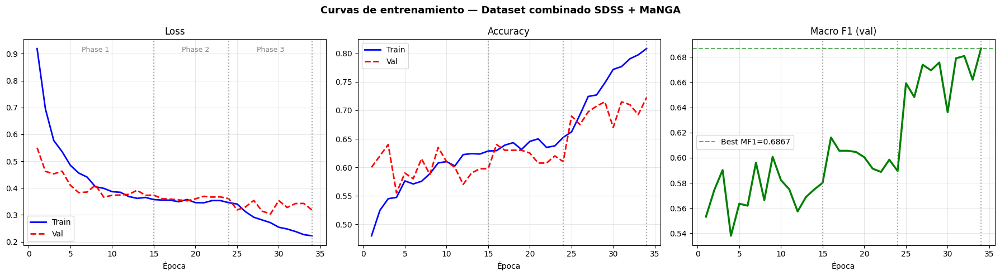

In [19]:
def plot_training_history(histories, labels):
    """Grafica loss, accuracy y macro-F1 de múltiples fases."""
    all_loss_train, all_loss_val = [], []
    all_acc_train, all_acc_val = [], []
    all_f1 = []
    for h in histories:
        all_loss_train.extend(h['train_loss'])
        all_loss_val.extend(h['val_loss'])
        all_acc_train.extend(h['train_acc'])
        all_acc_val.extend(h['val_acc'])
        all_f1.extend(h['macro_f1'])

    epochs = range(1, len(all_loss_train) + 1)
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    axes[0].plot(epochs, all_loss_train, 'b-', label='Train', lw=2)
    axes[0].plot(epochs, all_loss_val, 'r--', label='Val', lw=2)
    axes[0].set_title('Loss'); axes[0].set_xlabel('Época')
    axes[0].legend(); axes[0].grid(alpha=0.3)

    axes[1].plot(epochs, all_acc_train, 'b-', label='Train', lw=2)
    axes[1].plot(epochs, all_acc_val, 'r--', label='Val', lw=2)
    axes[1].set_title('Accuracy'); axes[1].set_xlabel('Época')
    axes[1].legend(); axes[1].grid(alpha=0.3)

    axes[2].plot(epochs, all_f1, 'g-', lw=2.5)
    axes[2].axhline(max(all_f1), color='green', ls='--', alpha=0.6,
                    label=f'Best MF1={max(all_f1):.4f}')
    axes[2].set_title('Macro F1 (val)'); axes[2].set_xlabel('Época')
    axes[2].legend(); axes[2].grid(alpha=0.3)

    # Marcar cambios de fase
    cumlen = 0
    for h, lbl in zip(histories, labels):
        cumlen += len(h['train_loss'])
        for ax in axes:
            ax.axvline(cumlen, color='gray', ls=':', alpha=0.7)
        axes[0].text(cumlen - len(h['train_loss'])//2, axes[0].get_ylim()[1]*0.95,
                     lbl, ha='center', fontsize=9, color='gray')

    plt.suptitle('Curvas de entrenamiento — Dataset combinado SDSS + MaNGA',
                 fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.show()

plot_training_history(
    [history_f1, history_f2, history_f3],
    ['Phase 1', 'Phase 2', 'Phase 3']
)

## 10.2 Evaluación completa — Confusion Matrix + Report

Cargando mejor checkpoint: outputs\best_combined_phase3.pt
Modelo cargado: outputs\best_combined_phase3.pt

              precision    recall  f1-score   support

       inner       0.89      0.71      0.79       252
       outer       0.55      0.70      0.61        67
 inner+outer       0.57      0.79      0.66        81

    accuracy                           0.72       400
   macro avg       0.67      0.73      0.69       400
weighted avg       0.76      0.72      0.73       400



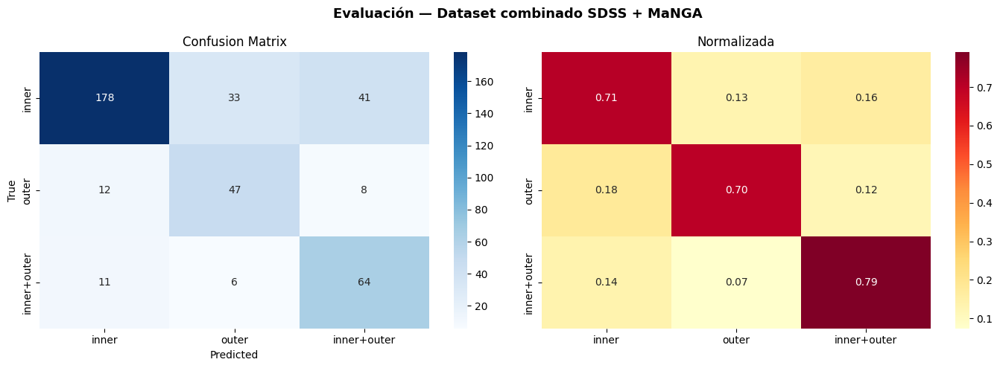


  Macro F1: 0.6867 | Weighted F1: 0.7316


In [20]:
# Cargar el mejor checkpoint antes de evaluar
# (opcional: si quieres evaluar el estado actual del modelo, omite estas líneas)
best_ckpt = max(OUTPUT_DIR.glob('best_combined_phase*.pt'),
                key=lambda p: p.stat().st_mtime, default=None)
if best_ckpt:
    print(f'Cargando mejor checkpoint: {best_ckpt}')
    model.load_model(str(best_ckpt))

report = model.evaluate(val_dataloader, plot=True)

---
# Parte 11: Inferencia por clase

Visualización rápida de predicciones por clase (estilo Stage2).
Para cada clase, se muestra una muestra aleatoria con su predicción y probabilidades.

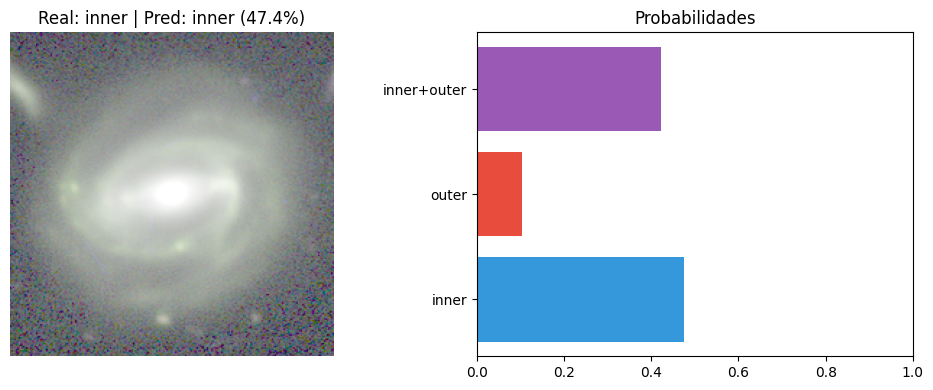

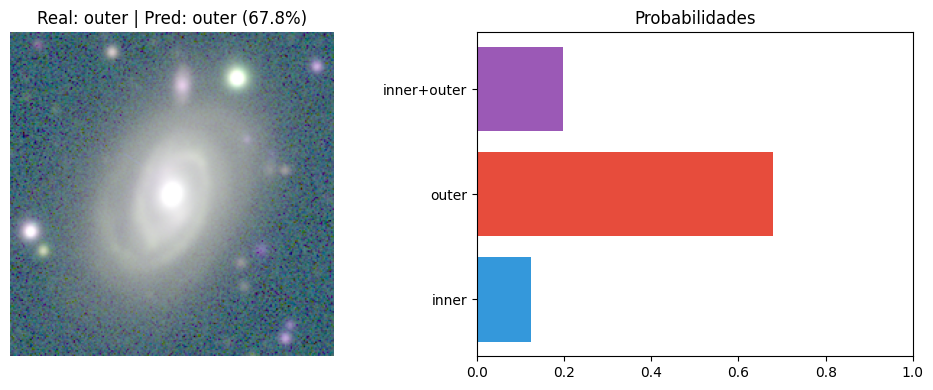

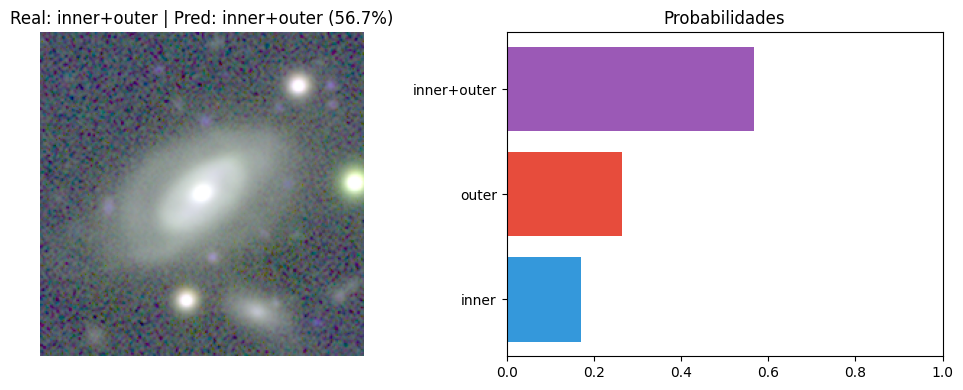

In [21]:
# Probar con muestras de cada clase
for cls_name in RING_TYPE:
    cls_dir = DATA_DIR / cls_name
    imgs = sorted(cls_dir.glob('*.png'))
    if imgs:
        sample = random.choice(imgs)
        img = Image.open(sample).convert('RGB')
        tensor = val_transform(img).unsqueeze(0).to(model.device)
        model.eval()
        with torch.no_grad():
            out = model(tensor)
            probs = F.softmax(out, dim=1).cpu().numpy()[0]
            pred_idx = int(np.argmax(probs))
        fig, axes = plt.subplots(1, 2, figsize=(10, 4))
        axes[0].imshow(img); axes[0].axis('off')
        axes[0].set_title(f'Real: {cls_name} | Pred: {RING_TYPE[pred_idx]} ({probs[pred_idx]:.1%})', fontsize=12)
        colors = ['#3498db', '#e74c3c', '#9b59b6']
        axes[1].barh(RING_TYPE, probs, color=colors)
        axes[1].set_xlim(0, 1); axes[1].set_title('Probabilidades')
        plt.tight_layout(); plt.show()


---
# Parte 12: Visualización de anillos — Análisis Morfológico (v5)

Funciones morfológicas avanzadas:
- `compute_radial_profile`: perfil de intensidad mediana por radio
- `azimuthal_profile`: validación de uniformidad azimutal
- `fit_ellipse_to_isophote`: ajuste de elipse sobre píxeles reales
- `detect_bar_improved`: detección de barra por perfil eps+PA
- `detect_rings_v5`: pipeline completo con filtro azimutal + fallback

In [22]:
# ============================================================
# Parte 12.1 — Análisis Morfológico Completo  (v5)
# ============================================================
# Integración del pipeline del documento de apoyo:
#   - azimuthal_profile: validación de uniformidad azimutal
#   - fit_ellipse_to_isophote: ajuste de elipse a isofota real
#   - detect_bar_improved: detección de barra por perfil eps+PA
#   - detect_rings_v5: orquesta todo con filtro azimutal + fallback
#
# Mejoras adicionales vs v4:
#   - max_ring_r calibrado: 0.82 * max_r (evita que el outer
#     toque el borde de imagen como pasaba con 0.88)
#   - Candidatos filtrados por uniformidad azimutal (>= 0.55)
#     antes de ajustar la elipse definitiva
#   - fit_ellipse_to_isophote trabaja sobre los PIXELES REALES
#     de la imagen en lugar de una mascara sintetica → el angulo
#     y la excentricidad reflejan la morfologia real
# ============================================================
from scipy.signal import savgol_filter, find_peaks


# ──────────────────────────────────────────────────────────────────────────
# 11.1.1  Perfil radial robusto
# ──────────────────────────────────────────────────────────────────────────

def compute_radial_profile(img, cy, cx, n_bins=80):
    """Perfil de intensidad mediana por radio desde (cy, cx)."""
    h, w = img.shape
    y_idx, x_idx = np.mgrid[0:h, 0:w]
    r_map = np.sqrt((x_idx - cx)**2 + (y_idx - cy)**2)
    max_r = min(cy, cx, h - cy, w - cx)
    bin_edges = np.linspace(0, max_r, n_bins + 1)
    profile = []
    for i in range(len(bin_edges) - 1):
        mask = (r_map >= bin_edges[i]) & (r_map < bin_edges[i + 1])
        profile.append(float(np.median(img[mask])) if mask.sum() > 0 else 0.0)
    radii_px  = (bin_edges[:-1] + np.diff(bin_edges) / 2)
    radii_arc = radii_px * PIXSCALE
    return radii_px, radii_arc, np.array(profile)


# ──────────────────────────────────────────────────────────────────────────
# 11.1.2  Perfil azimutal — uniformidad de un anillo candidato
# ──────────────────────────────────────────────────────────────────────────

def azimuthal_profile(img, center, radius_px, width=6, n_sectors=36):
    """
    Calcula el perfil de intensidad a lo largo de la circunferencia de radio
    `radius_px`. Devuelve un dict con:
        mean, std, cv (coef. variacion), is_ring_like (bool)
    Un anillo real tiene baja variacion azimutal (estructura cerrada y
    aproximadamente uniforme). Umbral empirico: cv < 0.45.
    """
    cy, cx = center
    h, w   = img.shape
    angles = np.linspace(0, 2 * np.pi, n_sectors, endpoint=False)
    values = []
    for a in angles:
        # Promedio en la anilla (radio ± width/2) a este angulo
        sector_vals = []
        for dr in range(-width // 2, width // 2 + 1):
            r = radius_px + dr
            if r <= 0:
                continue
            xp = int(np.round(cx + r * np.cos(a)))
            yp = int(np.round(cy + r * np.sin(a)))
            if 0 <= xp < w and 0 <= yp < h:
                sector_vals.append(float(img[yp, xp]))
        if sector_vals:
            values.append(np.mean(sector_vals))

    if not values:
        return {"mean": 0, "std": 0, "cv": 999, "is_ring_like": False}

    arr  = np.array(values)
    mean = float(arr.mean())
    std  = float(arr.std())
    cv   = std / (mean + 1e-10)
    return {
        "mean":        mean,
        "std":         std,
        "cv":          cv,
        "values":      arr,
        "is_ring_like": cv < 0.45,
    }


# ──────────────────────────────────────────────────────────────────────────
# 11.1.3  Ajuste de elipse a isofota real (sobre píxeles de la imagen)
# ──────────────────────────────────────────────────────────────────────────

def fit_ellipse_to_isophote(img, center, radius_px, tolerance=12, min_pts=12):
    """
    Extrae los píxeles de la imagen que caen dentro de la anilla
    [radius_px - tolerance, radius_px + tolerance] y ajusta una elipse
    con cv2.fitEllipse ponderada por intensidad.

    Retorna dict con: semi_a, semi_b, angle_deg, eccentricity,
                      cx, cy, circumference_px
    o None si no hay suficientes puntos.
    """
    cy, cx = center
    h, w   = img.shape
    y_idx, x_idx = np.mgrid[0:h, 0:w]
    r_map = np.sqrt((x_idx - cx)**2 + (y_idx - cy)**2)

    # Mascara de anilla
    ring_mask = (r_map >= radius_px - tolerance) & (r_map <= radius_px + tolerance)
    if ring_mask.sum() < min_pts:
        return None

    # Extraer coordenadas ponderadas por intensidad
    ys = y_idx[ring_mask].astype(np.float32)
    xs = x_idx[ring_mask].astype(np.float32)
    ws = img[ring_mask].astype(np.float32)
    ws = np.clip(ws, 0, None)
    ws_sum = ws.sum()
    if ws_sum < 1e-10:
        return None

    # Muestreo ponderado para no sobrecargar cv2.fitEllipse
    probs = ws / ws_sum
    n_sample = min(len(xs), 500)
    idx_sample = np.random.choice(len(xs), size=n_sample, replace=False, p=probs)
    pts = np.stack([xs[idx_sample], ys[idx_sample]], axis=1).astype(np.float32)

    if len(pts) < 5:
        return None
    try:
        (ex, ey), (ma, mi), angle = cv2.fitEllipse(pts)
    except cv2.error:
        return None

    semi_a = max(ma, mi) / 2.0
    semi_b = min(ma, mi) / 2.0
    # Excentricidad geometrica
    ecc = float(np.sqrt(1 - (semi_b / semi_a)**2)) if semi_a > 0 else 0.0
    # Circunferencia aproximada (formula de Ramanujan)
    a_, b_ = semi_a, semi_b
    circ = np.pi * (3*(a_+b_) - np.sqrt((3*a_+b_)*(a_+3*b_)))

    return {
        "semi_a":          float(semi_a),
        "semi_b":          float(semi_b),
        "angle":           (float(angle) + 90.0) % 180.0,   # cv2→mpl: +90
        "eccentricity":    ecc,
        "cx":              float(ex),
        "cy":              float(ey),
        "circumference_px": float(circ),
    }


# ──────────────────────────────────────────────────────────────────────────
# 11.1.4  Detección de barra mejorada (perfil eps + PA)
# ──────────────────────────────────────────────────────────────────────────

def _isophote_ellipticity_profile(img, center, radii_px, min_pts=20):
    """Perfil de elipticidad e PA por radio, para deteccion de barra."""
    eps_vals, pa_vals, r_valid = [], [], []
    for r in radii_px:
        ell = fit_ellipse_to_isophote(img, center, r, tolerance=max(3, int(r*0.12)), min_pts=min_pts)
        if ell is None:
            continue
        eps_vals.append(ell["eccentricity"])
        pa_vals.append(ell["angle"])
        r_valid.append(r)
    return np.array(r_valid), np.array(eps_vals), np.array(pa_vals)


def detect_bar_improved(img, center, max_r, n_radii=18):
    """
    Detecta barra galáctica combinando:
      1. Pico de elipticidad en el perfil de isofotas centrales
      2. PA constante en la region de la barra seguido de giro brusco

    Retorna dict o None.
    """
    cy, cx = center
    # Explorar el tercio interior de la imagen
    r_probe = np.linspace(max_r * 0.06, max_r * 0.50, n_radii)
    r_vals, eps_vals, pa_vals = _isophote_ellipticity_profile(img, center, r_probe)

    if len(r_vals) < 4:
        return None

    # Suavizar
    win = min(5, len(eps_vals) - 1) | 1
    eps_s = uniform_filter1d(eps_vals, size=win) if len(eps_vals) >= win else eps_vals
    pa_s  = uniform_filter1d(pa_vals,  size=win) if len(pa_vals)  >= win else pa_vals

    # Buscar pico de eps en interior
    peak_idx = int(np.argmax(eps_s))
    peak_eps  = float(eps_s[peak_idx])
    bar_r     = float(r_vals[peak_idx])

    # Criterio: eps > 0.30 para ser considerada barra
    if peak_eps < 0.30:
        return None

    # PA de la barra = PA en el pico
    bar_pa    = float(pa_s[peak_idx])
    bar_len   = bar_r * 2 * PIXSCALE

    # Calculo aspecto (relacion largo/ancho) aproximado
    ell_at_bar = fit_ellipse_to_isophote(img, center, bar_r, tolerance=max(3, int(bar_r*0.15)))
    aspect = float(ell_at_bar["semi_a"] / max(ell_at_bar["semi_b"], 1e-3)) if ell_at_bar else 2.0

    return {
        "angle":            bar_pa,
        "bar_radius_px":    bar_r,
        "length_arcsec":    bar_len,
        "aspect_ratio":     aspect,
        "ellipticity_peak": peak_eps,
        "ellipticity_profile": (r_vals, eps_vals, pa_vals),
    }


def measure_bar_endpoints(img, center, bar_info):
    """Calcula los extremos de la barra para dibujarla en imagen."""
    cy, cx = center
    angle_rad = np.radians(bar_info["angle"])
    r = bar_info["bar_radius_px"]
    x1 = cx + r * np.cos(angle_rad)
    y1 = cy + r * np.sin(angle_rad)
    x2 = cx - r * np.cos(angle_rad)
    y2 = cy - r * np.sin(angle_rad)
    return (x1, y1), (x2, y2)


# ──────────────────────────────────────────────────────────────────────────
# 11.1.5  Búsqueda de radios candidatos (picos + inflexiones)
# ──────────────────────────────────────────────────────────────────────────

def _find_ring_radii_from_profile(profile, radii_px, max_ring_r):
    """
    Combina picos directos + inflexiones de curvatura para detectar
    anillos de alto y bajo contraste.
    """
    cut  = int(np.searchsorted(radii_px, max_ring_r))
    prof = profile[:cut]
    rpx  = radii_px[:cut]
    if len(prof) < 8:
        return []

    win = max(5, len(prof) // 6)
    if win % 2 == 0: win += 1
    try:
        prof_s = savgol_filter(prof, win, 3)
    except Exception:
        prof_s = prof.copy()

    skip = max(2, int(len(prof_s) * 0.04))
    search = prof_s[skip:]
    dyn  = search.max() - search.min()

    # a) Picos directos — threshold bajo para no perder anillos tenues
    peaks_a, _ = find_peaks(
        search,
        distance=max(3, len(search) // 10),
        prominence=max(dyn * 0.010, 1e-5),
        width=1,
    )
    candidates = set(int(rpx[p + skip]) for p in peaks_a)

    # b) Inflexiones de curvatura (hombros)
    d2 = np.gradient(np.gradient(prof_s))
    for idx in np.where((d2[:-1] < 0) & (d2[1:] >= 0))[0]:
        r = int(rpx[idx])
        if r >= int(radii_px[skip]):
            candidates.add(r)

    return sorted(r for r in candidates if 5 < r <= max_ring_r)


# ──────────────────────────────────────────────────────────────────────────
# 11.1.6  Fallback de radio basado en caída de perfil
# ──────────────────────────────────────────────────────────────────────────

def _fallback_radius(profile, radii_px, max_ring_r):
    """Radio donde la intensidad cae al 50% (inner) y 20% (outer) del pico."""
    peak = profile.max()
    if peak < 1e-10:
        return int(radii_px[len(radii_px)//3]), int(radii_px[int(len(radii_px)*0.7)])

    def _r_at(f):
        below = np.where(profile <= peak * f)[0]
        return int(radii_px[below[0]]) if len(below) > 0 else int(radii_px[len(radii_px)//2])

    r_in  = int(np.clip(_r_at(0.50), 6,             max_ring_r * 0.45))
    r_out = int(np.clip(_r_at(0.20), r_in * 1.5,    max_ring_r))
    return r_in, r_out


# ──────────────────────────────────────────────────────────────────────────
# 11.1.7  Forma de la galaxia
# ──────────────────────────────────────────────────────────────────────────

def get_galaxy_shape(img, cy, cx):
    """Orientación y razón axial de la galaxia por PCA ponderado."""
    h, w = img.shape
    y_idx, x_idx = np.mgrid[0:h, 0:w]
    r_eff = max(h, w) * 0.25
    mask = ((x_idx - cx)**2 + (y_idx - cy)**2) < r_eff**2
    weights = img[mask].flatten()
    if weights.sum() < 1e-10:
        return 0.0, 0.75, r_eff
    ys = y_idx[mask].flatten()
    xs = x_idx[mask].flatten()
    X = np.stack([xs - cx, ys - cy], axis=1).astype(float)
    cov = np.cov(X.T, aweights=np.clip(weights, 0, None))
    vals, vecs = np.linalg.eigh(cov)
    idx = vals.argsort()[::-1]
    vals, vecs = vals[idx], vecs[:, idx]
    angle = float(np.degrees(np.arctan2(vecs[1, 0], vecs[0, 0])))
    ratio = float(np.clip(np.sqrt(abs(vals[1]) / (abs(vals[0]) + 1e-10)), 0.3, 1.0))
    r_eff_est = float(np.sqrt(abs(vals[0])))
    return angle, ratio, max(r_eff_est, 8.0)


# ──────────────────────────────────────────────────────────────────────────
# 11.1.8  detect_rings_v5 — pipeline principal
# ──────────────────────────────────────────────────────────────────────────

def detect_rings_v5(img_rgb, predicted_class):
    """
    Pipeline completo de detección de anillos (v5).

    Flujo:
      1. Centroide ponderado para refinar centro
      2. Perfil radial robusto (80 bins)
      3. Candidatos: picos + inflexiones del perfil
      4. Filtro azimutal: descartar candidatos no uniformes (cv >= 0.45)
      5. Ajuste de elipse sobre pixeles reales (fit_ellipse_to_isophote)
      6. Asignación por clase predicha + fallback robusto

    Retorna: (list[dict_ring], (cy, cx))
    """
    gray   = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    gray_f = gray.astype(np.float32) / 255.0
    h, w   = gray_f.shape

    # ── 1. Centro ─────────────────────────────────────────────────────────
    cy0, cx0  = h // 2, w // 2
    search_r  = min(h, w) // 4
    y_idx, x_idx = np.mgrid[0:h, 0:w]
    cmask  = ((x_idx - cx0)**2 + (y_idx - cy0)**2) < search_r**2
    region = gray_f * cmask
    tw     = region.sum()
    if tw > 1e-6:
        cy = int(np.clip(np.sum(y_idx * region) / tw, h * 0.15, h * 0.85))
        cx = int(np.clip(np.sum(x_idx * region) / tw, w * 0.15, w * 0.85))
    else:
        cy, cx = cy0, cx0

    smoothed = gaussian(gray_f, sigma=2.0)
    galaxy_angle, galaxy_ratio, _ = get_galaxy_shape(gray_f, cy, cx)

    # ── 2. Rango y perfil ─────────────────────────────────────────────────
    max_r       = min(cy, cx, h - cy, w - cx)
    max_ring_r  = max_r * 0.82        # 0.82 evita que el outer toque el borde

    radii_px, radii_arc, profile = compute_radial_profile(gray_f, cy, cx, n_bins=80)

    # ── 3. Candidatos ─────────────────────────────────────────────────────
    raw_candidates = _find_ring_radii_from_profile(profile, radii_px, max_ring_r)

    # ── 4. Filtro azimutal ────────────────────────────────────────────────
    validated = []
    for rpx in raw_candidates:
        az = azimuthal_profile(smoothed, (cy, cx), rpx, width=6)
        if az["is_ring_like"]:
            validated.append({"radius_px": int(rpx), "az": az})

    # ── 5. Ajuste de elipse sobre pixeles reales ──────────────────────────
    ellipses = []
    for cand in validated:
        rpx = cand["radius_px"]
        tol = max(8, int(rpx * 0.18))
        ell = fit_ellipse_to_isophote(smoothed, (cy, cx), rpx, tolerance=tol)
        if ell is None:
            # Fallback a ajuste sintetico si fit_ellipse_to_isophote falla
            sa, sb, ang = _fit_ellipse_synthetic(smoothed, cy, cx, rpx, galaxy_angle, galaxy_ratio)
            ell = {"semi_a": sa, "semi_b": sb, "angle": ang,
                   "eccentricity": 1 - sb/sa if sa > 0 else 0,
                   "cx": float(cx), "cy": float(cy)}
        ellipses.append({
            "semi_a":     ell["semi_a"],
            "semi_b":     ell["semi_b"],
            "angle":      ell["angle"],
            "radius_px":  rpx,
            "detected":   True,
            "az_cv":      cand["az"]["cv"],
        })

    ellipses.sort(key=lambda e: e["radius_px"])
    ellipses = [e for e in ellipses if 4 < e["radius_px"] <= max_ring_r]

    # NMS: merge candidates dentro de 15% del radio para evitar duplicados
    merged = []
    for e in ellipses:
        if not merged:
            merged.append(e)
        else:
            prev = merged[-1]
            if abs(e["radius_px"] - prev["radius_px"]) < max_ring_r * 0.15:
                # conservar el de menor az_cv (mas uniforme)
                if e.get("az_cv", 1) < prev.get("az_cv", 1):
                    merged[-1] = e
            else:
                merged.append(e)
    ellipses = merged

    # ── Fallback global ───────────────────────────────────────────────────
    r_fb_in, r_fb_out = _fallback_radius(profile, radii_px, max_ring_r)

    def _make_ring(rpx, rtype):
        tol = max(8, int(rpx * 0.18))
        ell = fit_ellipse_to_isophote(smoothed, (cy, cx), rpx, tolerance=tol)
        if ell:
            return {"semi_a": ell["semi_a"], "semi_b": ell["semi_b"],
                    "angle": ell["angle"], "radius_px": int(rpx),
                    "type": rtype, "detected": False}
        sa, sb, ang = _fit_ellipse_synthetic(smoothed, cy, cx, rpx, galaxy_angle, galaxy_ratio)
        return {"semi_a": sa, "semi_b": sb, "angle": ang,
                "radius_px": int(rpx), "type": rtype, "detected": False}

    # ── 6. Asignación por clase ───────────────────────────────────────────
    result = []

    if predicted_class == "inner":
        if ellipses:
            e = ellipses[0].copy(); e["type"] = "Inner"; result = [e]
        else:
            result = [_make_ring(r_fb_in, "Inner")]

    elif predicted_class == "outer":
        if ellipses:
            e = ellipses[-1].copy(); e["type"] = "Outer"; result = [e]
        else:
            result = [_make_ring(r_fb_out, "Outer")]

    else:  # inner+outer
        if len(ellipses) >= 2:
            ie, oe = ellipses[0].copy(), ellipses[-1].copy()
            if oe["radius_px"] > ie["radius_px"] * 1.4:
                ie["type"] = "Inner"; oe["type"] = "Outer"
                result = [ie, oe]
            else:
                ie["type"] = "Inner"
                r_out = int(np.clip(ie["radius_px"] * 2.2, r_fb_out, max_ring_r))
                result = [ie, _make_ring(r_out, "Outer")]
        elif len(ellipses) == 1:
            e = ellipses[0]
            half = max_ring_r / 2.0
            if e["radius_px"] < half:
                e["type"] = "Inner"
                r_out = int(np.clip(max(e["radius_px"] * 2.2, r_fb_out), r_fb_out, max_ring_r))
                result = [e, _make_ring(r_out, "Outer")]
            else:
                e["type"] = "Outer"
                r_in = int(np.clip(e["radius_px"] * 0.38, r_fb_in, e["radius_px"] * 0.6))
                result = [_make_ring(r_in, "Inner"), e]
        else:
            result = [_make_ring(r_fb_in, "Inner"), _make_ring(r_fb_out, "Outer")]

    return result, (cy, cx)


def _fit_ellipse_synthetic(img, cy, cx, radius_px, galaxy_angle, galaxy_ratio):
    """Ajuste sintetico de elipse (fallback interno de v5)."""
    h, w = img.shape
    ring_mask = np.zeros((h, w), dtype=np.uint8)
    thickness = max(3, int(radius_px * 0.18))
    for dr in range(-thickness, thickness + 1):
        r = radius_px + dr
        if r <= 0: continue
        b = max(2, int(r * galaxy_ratio))
        cv2.ellipse(ring_mask, (int(cx), int(cy)), (int(r), int(b)),
                    int(galaxy_angle), 0, 360, 1, -1)
    contours, _ = cv2.findContours(ring_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    if contours:
        pts = np.vstack(contours).squeeze()
        if len(pts) >= 5:
            try:
                (ex, ey), (ma, mi), angle = cv2.fitEllipse(pts)
                return float(max(ma,mi))/2, float(min(ma,mi))/2, (float(angle)+90.0)%180.0
            except Exception:
                pass
    b = max(2, int(radius_px * galaxy_ratio))
    return float(radius_px), float(b), (float(galaxy_angle)+90.0) % 180.0


# Alias retrocompatible
detect_rings_v3 = detect_rings_v5
detect_rings_v4 = detect_rings_v5

print("Funciones morfologicas v5 cargadas")
print("  + azimuthal_profile")
print("  + fit_ellipse_to_isophote")
print("  + detect_bar_improved")
print("  + detect_rings_v5 (alias: v3, v4)")


Funciones morfologicas v5 cargadas
  + azimuthal_profile
  + fit_ellipse_to_isophote
  + detect_bar_improved
  + detect_rings_v5 (alias: v3, v4)


## 12.2 Visualización de muestras con detección de anillos

Visualizando muestras con deteccion de anillos (v5)...


 Clase: INNER


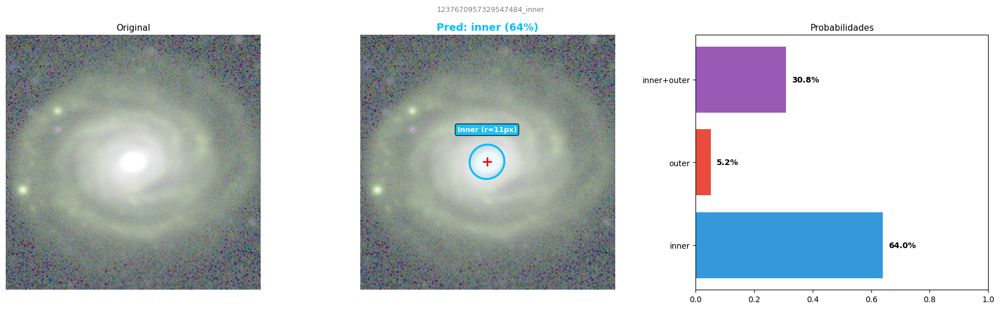

  Inner  (detectado): r=11px


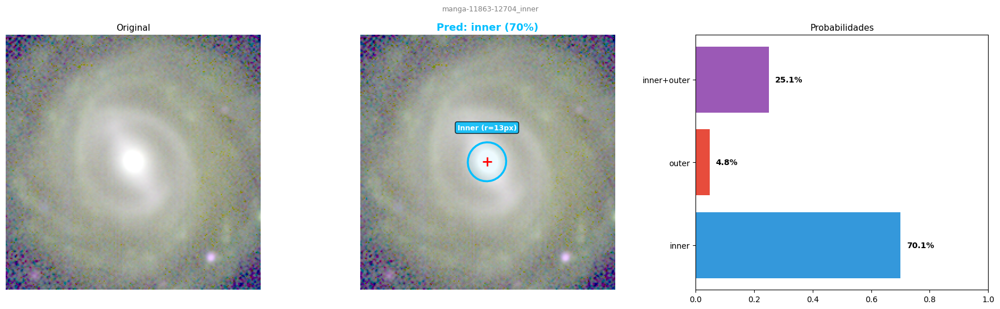

  Inner  (detectado): r=13px


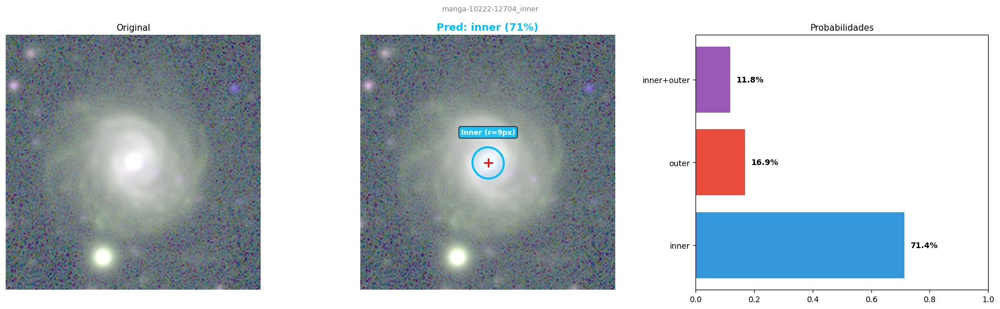

  Inner  (detectado): r=9px

 Clase: OUTER


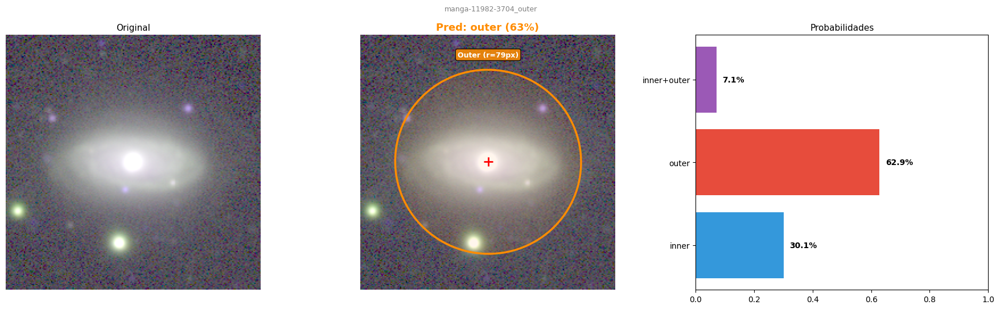

  Outer  (detectado): r=79px


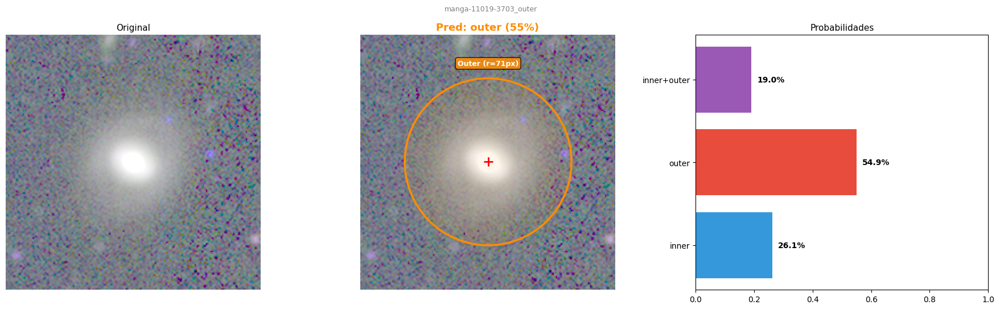

  Outer  (detectado): r=71px


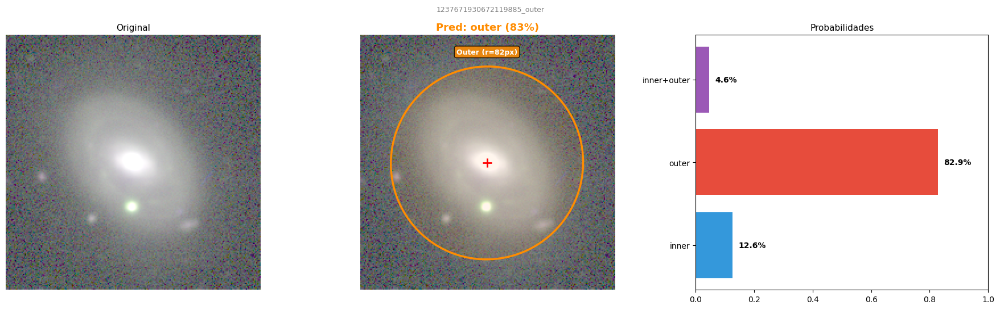

  Outer  (detectado): r=82px

 Clase: INNER+OUTER


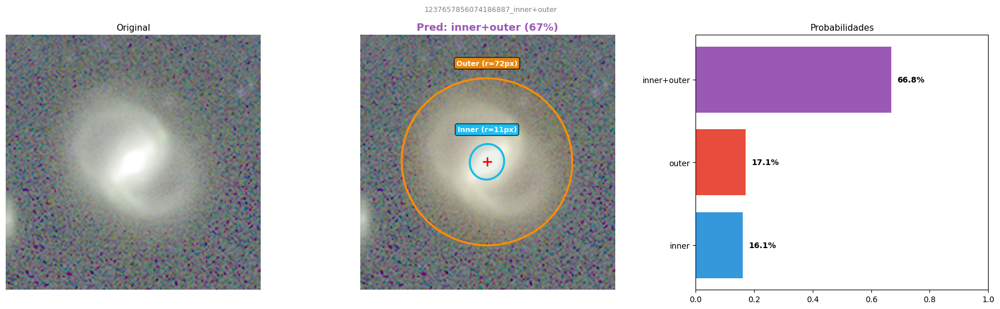

  Inner  (detectado): r=11px
  Outer  (detectado): r=72px


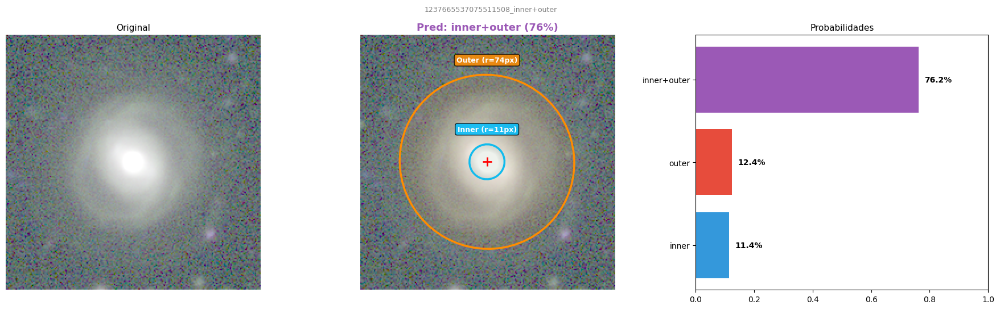

  Inner  (detectado): r=11px
  Outer  (detectado): r=74px


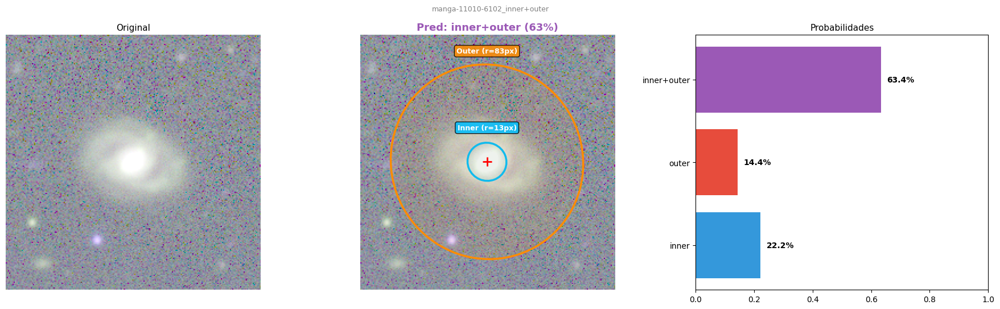

  Inner  (detectado): r=13px
  Outer  (detectado): r=83px


In [23]:
from scipy.ndimage import uniform_filter1d
def visualize_galaxy_rings(model, img_path, show_probs=True, show_profile=False):
    """
    Predice clase y dibuja anillos con Ellipse patches (v5).

    Parametros
    ----------
    model        : ZoobotRingSubclassifier cargado
    img_path     : Path al PNG
    show_probs   : mostrar panel de probabilidades (True por defecto)
    show_profile : mostrar panel extra de perfil radial + elipticidad
    """
    model.eval()
    img     = Image.open(img_path).convert("RGB")
    img_rgb = np.array(img)
    tensor  = val_transform(img).unsqueeze(0).to(model.device)

    with torch.no_grad():
        output    = model(tensor)
        probs     = F.softmax(output, dim=1).cpu().numpy()[0]
        pred_idx  = int(np.argmax(probs))
        pred_class = RING_TYPE[pred_idx]
        confidence = probs[pred_idx]

    rings, (cy, cx) = detect_rings_v5(img_rgb, pred_class)

    # ── Deteccion de barra (sobre imagen suavizada) ──────────────────────
    gray_f   = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0
    smoothed = gaussian(gray_f, sigma=2.0)
    max_r    = min(cy, cx, img_rgb.shape[0] - cy, img_rgb.shape[1] - cx)
    bar_info = detect_bar_improved(smoothed, (cy, cx), max_r)

    # ── Layout: 2 + (1 si probs) + (1 si profile) ───────────────────────
    ncols = 2 + int(show_probs) + int(show_profile)
    fig, axes = plt.subplots(1, ncols, figsize=(6 * ncols, 5.5))

    ring_colors  = {"Inner": "#00BFFF", "Outer": "#FF8C00"}
    title_color  = {"inner": "#00BFFF", "outer": "#FF8C00", "inner+outer": "#9b59b6"}

    # ── Panel 0: Original ────────────────────────────────────────────────
    axes[0].imshow(img_rgb)
    axes[0].axis("off")
    axes[0].set_title("Original", fontsize=11)

    # ── Panel 1: Deteccion ───────────────────────────────────────────────
    axes[1].imshow(img_rgb)
    axes[1].plot(cx, cy, "r+", markersize=12, markeredgewidth=2)

    for ring in rings:
        rtype = ring["type"]
        color = ring_colors.get(rtype, "#FFFF00")
        ls    = "-"  if ring.get("detected", True) else "--"
        lw    = 2.5  if ring.get("detected", True) else 2.0

        # Angulo directo (sin negar) — cv2 ya esta en convencion matplotlib
        ep = Ellipse(
            xy=(cx, cy),
            width=ring["semi_a"] * 2, height=ring["semi_b"] * 2,
            angle=ring["angle"],
            fill=False, edgecolor=color, linewidth=lw, linestyle=ls
        )
        axes[1].add_patch(ep)
        ef = Ellipse(
            xy=(cx, cy),
            width=ring["semi_a"] * 2, height=ring["semi_b"] * 2,
            angle=ring["angle"],
            fill=True, facecolor=color, alpha=0.07
        )
        axes[1].add_patch(ef)

        tag    = "" if ring.get("detected", True) else " ~"
        lbl_y  = cy - ring["semi_b"] - 10
        axes[1].annotate(
            f"{rtype} (r={ring['radius_px']}px){tag}",
            xy=(cx, max(5, lbl_y)),
            fontsize=9, color="white", fontweight="bold",
            ha="center", va="bottom",
            bbox=dict(boxstyle="round,pad=0.3", facecolor=color, alpha=0.85)
        )

    # Dibujar barra si se detecto
    if bar_info is not None:
        (x1, y1), (x2, y2) = measure_bar_endpoints(smoothed, (cy, cx), bar_info)
        axes[1].plot([x1, x2], [y1, y2], color="lime", linewidth=3, alpha=0.85)
        axes[1].annotate(
            f"Barra {bar_info['length_arcsec']:.1f}\"  PA={bar_info['angle']:.0f}deg",
            xy=(cx, cy + max_r * 0.55),
            fontsize=8, color="lime", fontweight="bold", ha="center",
            bbox=dict(boxstyle="round,pad=0.25", facecolor="black", alpha=0.65)
        )

    axes[1].set_title(
        f"Pred: {pred_class} ({confidence:.0%})",
        fontsize=13, fontweight="bold",
        color=title_color.get(pred_class, "black")
    )
    axes[1].axis("off")

    col = 2
    # ── Panel 2 (opcional): Probabilidades ───────────────────────────────
    if show_probs:
        colors_bar = ["#3498db", "#e74c3c", "#9b59b6"]
        bars = axes[col].barh(RING_TYPE, probs, color=colors_bar)
        axes[col].set_xlim(0, 1)
        axes[col].set_title("Probabilidades", fontsize=11)
        for bar, p in zip(bars, probs):
            axes[col].text(
                bar.get_width() + 0.02, bar.get_y() + bar.get_height() / 2,
                f"{p:.1%}", va="center", fontweight="bold", fontsize=10
            )
        col += 1

    # ── Panel 3 (opcional): Perfil radial + elipticidad ──────────────────
    if show_profile:
        radii_px, radii_arc, profile = compute_radial_profile(gray_f, cy, cx, n_bins=80)
        max_ring_r = max_r * 0.82
        win = max(5, len(profile) // 6)
        if win % 2 == 0: win += 1
        try:    prof_s = savgol_filter(profile, win, 3)
        except: prof_s = profile.copy()

        ax_p = axes[col]
        ax_p.plot(radii_px, profile, color="gray", lw=0.8, alpha=0.4, label="raw")
        ax_p.plot(radii_px, prof_s,  color="#3498db", lw=1.8, label="suavizado")
        for ring in rings:
            rc = ring_colors.get(ring["type"], "#FFFF00")
            ax_p.axvline(ring["radius_px"], color=rc, ls="--", lw=1.5, alpha=0.9,
                         label=f"{ring['type']} ({ring['radius_px']}px)")
        if bar_info:
            ax_p.axvspan(0, bar_info["bar_radius_px"], alpha=0.10,
                         color="lime", label=f"Barra (r={bar_info['bar_radius_px']:.0f}px)")
        ax_p.set_xlabel("Radio (px)")
        ax_p.set_ylabel("Intensidad mediana")
        ax_p.set_title("Perfil radial")
        ax_p.legend(fontsize=7, loc="upper right")
        ax_p.grid(True, alpha=0.3)

    plt.suptitle(Path(img_path).stem[:50], fontsize=9, color="gray")
    plt.tight_layout()
    plt.show()

    return {
        "class":      pred_class,
        "confidence": float(confidence),
        "rings":      rings,
        "bar":        bar_info,
    }


# ── Demo: 3 muestras por clase ────────────────────────────────────────────
print("Visualizando muestras con deteccion de anillos (v5)...\n")
for cls_name in RING_TYPE:
    cls_dir = DATA_DIR / cls_name
    imgs = sorted(cls_dir.glob("*.png"))
    if not imgs: continue
    print(f'\n{"="*50}\n Clase: {cls_name.upper()}\n{"="*50}')
    samples = random.sample(imgs, min(3, len(imgs)))
    for img_path in samples:
        result = visualize_galaxy_rings(model, img_path, show_probs=True, show_profile=False)
        for r in result["rings"]:
            det = "detectado" if r.get("detected", True) else "estimado"
            print(f"  {r['type']:6s} ({det}): r={r['radius_px']}px")
        if result["bar"]:
            b = result["bar"]
            print(f"  Barra: L={b['length_arcsec']:.1f}\"  PA={b['angle']:.1f}deg  "
                  f"eps={b['ellipticity_peak']:.2f}")


---
# Parte 13: Exportar modelo final

In [24]:
final_path = OUTPUT_DIR / 'zoobot_ring_subclassifier_combined_v8_final.pt'
model.save_model(str(final_path))

# Guardar metadatos del modelo
import json
meta = {
    'model': 'ZoobotRingSubclassifier',
    'version': 'v8_combined',
    'encoder': 'hf_hub:mwalmsley/zoobot-encoder-convnext_nano',
    'classes': RING_TYPE,
    'datasets': ['SDSS DR10 (dataset.csv)', 'MaNGA DR9 (MaNGA_rings.csv)'],
    'n_train': len(df_sdss_rings) + len(df_manga_rings),
    'transform': TRANSFORM,
    'image_size': IMAGE_SIZE,
    'pixscale': PIXSCALE,
}
meta_path = OUTPUT_DIR / 'model_metadata_v8.json'
with open(meta_path, 'w') as f:
    json.dump(meta, f, indent=2)

print(f'Modelo exportado: {final_path}')
print(f'Metadatos:        {meta_path}')
print('\nListo ✓')

Modelo guardado: outputs\zoobot_ring_subclassifier_combined_v8_final.pt
Modelo exportado: outputs\zoobot_ring_subclassifier_combined_v8_final.pt
Metadatos:        outputs\model_metadata_v8.json

Listo ✓


---
# Parte 14: Análisis Morfológico por Isofotas

Este módulo realiza un análisis estructural de la galaxia a partir de las **isofotas**
(curvas de igual brillo superficial) ajustadas mediante elipses, análogo al método
IRAF/ellipse clásico pero implementado con OpenCV sobre los FITS o PNGs ya generados.

| Función | Descripción |
|---|---|
| `compute_isophote_ellipses` | Ajusta elipses a contornos de igual brillo — tabla de isofotas |
| `compute_ellipticity_profile` | Extrae `eps = 1 - b/a` y PA en función del semieje mayor |
| `detect_ring_from_isophotes` | Detecta anillos como picos de `eps` o cambios de PA |
| `visualize_isophote_analysis` | Panel 6-paneles: imagen + isofotas + anillos + perfiles |

```python
# Desde FITS (recomendado — mayor dinámica, banda r)
result = analyze_galaxy_isophotes_fits(fits_path, pred_class)

# Desde PNG (cuando no hay FITS disponible)
result = analyze_galaxy_isophotes_png(png_path, pred_class)
```

> **Nota:** `result['rings_iso']` contiene los anillos detectados por isofotas,
> independientes de `detect_rings_v3`. El campo `source` indica `'fits'` o `'png'`.


In [25]:
# ============================================================
# Parte 14: Análisis Morfológico por Isofotas  (v2 — corregido)
# ============================================================
# Correcciones respecto a v1:
#   1. Colormap oscuro (magma + display RGB) para coincidir con
#      la visualización del clasificador (fondo negro)
#   2. Convención de ángulo corregida: cv2.fitEllipse devuelve el
#      ángulo del eje mayor normalizado a [0,180); se aplica
#      directamente a Ellipse(angle=...) sin offset adicional
#   3. Rango outer ampliado a 0.92 * image_r y umbral extendido
#      al percentil 1-99 para capturar anillos tenues
# ============================================================
import matplotlib.gridspec as gridspec
from matplotlib.colors import LogNorm
from scipy.ndimage import gaussian_filter, uniform_filter1d
from scipy.signal import argrelextrema

try:
    from photutils.isophote import EllipseGeometry, Ellipse as PhotoEllipse
    _PHOTUTILS = True
except ImportError:
    _PHOTUTILS = False


# ──────────────────────────────────────────────────────────────────────────
# 13.1  Carga de imagen
# ──────────────────────────────────────────────────────────────────────────

def _load_gray_from_fits(fits_path, band_idx=1):
    """Lee banda r (indice 1 en GRZ) normalizada [0,1].
    Percentil 0.5-99.8 para preservar brillo tenue de anillos outer."""
    with fits.open(fits_path) as hdul:
        data = hdul[0].data
    band = data[band_idx].astype(np.float32)
    p1, p99 = np.nanpercentile(band, [0.5, 99.8])
    band = np.clip(band, p1, p99)
    band = (band - p1) / max(float(p99 - p1), 1e-12)
    return band


def _load_gray_from_png(png_path):
    """Lee PNG RGB y convierte a luminancia float32 [0,1]."""
    img = np.array(Image.open(png_path).convert("RGB")).astype(np.float32)
    gray = 0.2126 * img[..., 0] + 0.7152 * img[..., 1] + 0.0722 * img[..., 2]
    return gray / 255.0


def _make_display_rgb(gray):
    """Convierte luminancia [0,1] a RGB estilo Legacy Survey (fondo negro, stretch log)."""
    stretched = np.log1p(gray * 1000.0) / np.log1p(1000.0)
    rgb = plt.cm.magma(stretched)[..., :3]
    return (rgb * 255).astype(np.uint8)


# ──────────────────────────────────────────────────────────────────────────
# 13.2  Ajuste de elipses a contornos de igual brillo (isofotas)
# ──────────────────────────────────────────────────────────────────────────

def compute_isophote_ellipses(gray, n_levels=35, min_pts=8, blur_sigma=1.5):
    """
    Ajusta elipses a contornos de igual brillo usando OpenCV.

    Mejoras v2:
      - Umbral percentil 1-99 (antes 3-97): captura anillos outer tenues
      - Limite superior de semieje a 0.90 * (min(h,w)/2)
      - Angulo normalizado a [0,180) con convencion correcta

    Retorna pd.DataFrame: level, cx, cy, semi_a, semi_b,
                          angle_deg, pa_deg, ellipticity, sma_arcsec, sb
    """
    smoothed = gaussian_filter(gray, sigma=blur_sigma)
    vmin, vmax = np.percentile(smoothed, [1, 99])
    levels = np.linspace(vmin, vmax, n_levels + 2)[1:-1]

    h, w = gray.shape
    max_r = min(h, w) / 2.0

    img_u8 = np.clip(
        (smoothed - vmin) / max(float(vmax - vmin), 1e-12) * 255, 0, 255
    ).astype(np.uint8)

    records = []
    for lev in levels:
        thresh = int((lev - vmin) / max(float(vmax - vmin), 1e-12) * 255)
        _, binary = cv2.threshold(img_u8, thresh, 255, cv2.THRESH_BINARY)
        contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        if not contours:
            continue
        cnt = max(contours, key=cv2.contourArea)
        if len(cnt) < min_pts:
            continue
        pts = cnt.squeeze()
        if pts.ndim != 2 or len(pts) < 5:
            continue
        try:
            (ex, ey), (ma, mi), angle_cv2 = cv2.fitEllipse(pts)
        except cv2.error:
            continue

        semi_a = max(ma, mi) / 2.0
        semi_b = min(ma, mi) / 2.0

        if semi_a < 3 or semi_a > max_r * 0.90:
            continue
        if ex < 2 or ex > w - 2 or ey < 2 or ey > h - 2:
            continue

        # cv2.fitEllipse: angulo del eje mayor desde eje X en sentido antihorario
        # matplotlib Ellipse(angle=): misma convencion. Normalizar a [0,180)
        pa_deg = (float(angle_cv2) + 90.0) % 180.0   # cv2→mpl: +90
        ellipticity = 1.0 - semi_b / semi_a if semi_a > 0 else 0.0

        ring_mask = np.zeros((h, w), np.uint8)
        thickness = max(2, int(semi_a * 0.08))
        cv2.drawContours(ring_mask, [cnt], -1, 255, thickness=thickness)
        mean_sb = float(np.mean(gray[ring_mask > 0])) if ring_mask.sum() > 0 else float(lev)

        records.append({
            "level":       float(lev),
            "cx":          float(ex),
            "cy":          float(ey),
            "semi_a":      float(semi_a),
            "semi_b":      float(semi_b),
            "angle_deg":   float(pa_deg),
            "pa_deg":      float(pa_deg),
            "ellipticity": float(ellipticity),
            "sma_arcsec":  float(semi_a) * PIXSCALE,
            "sb":          float(mean_sb),
        })

    df_iso = pd.DataFrame(records).sort_values("semi_a").reset_index(drop=True)
    return df_iso


# ──────────────────────────────────────────────────────────────────────────
# 13.3  Perfiles de elipticidad y PA
# ──────────────────────────────────────────────────────────────────────────

def compute_ellipticity_profile(df_iso, smooth_window=5):
    """Suaviza eps y PA; agrega eps_smooth, pa_smooth, deps_da, dpa_da."""
    if len(df_iso) < smooth_window:
        df_iso = df_iso.copy()
        df_iso["eps_smooth"] = df_iso["ellipticity"]
        df_iso["pa_smooth"]  = df_iso["pa_deg"]
        df_iso["deps_da"]    = 0.0
        df_iso["dpa_da"]     = 0.0
        return df_iso

    eps = df_iso["ellipticity"].values.copy()
    pa  = df_iso["pa_deg"].values.copy()
    sma = df_iso["sma_arcsec"].values.copy()

    w_size = min(smooth_window, len(eps) - 1) | 1
    eps_s  = uniform_filter1d(eps, size=w_size)
    pa_s   = uniform_filter1d(pa,  size=w_size)

    da    = np.gradient(sma)
    da    = np.where(np.abs(da) < 1e-10, 1e-10, da)
    deps  = np.gradient(eps_s) / da
    dpa   = np.gradient(pa_s)  / da

    df_iso = df_iso.copy()
    df_iso["eps_smooth"] = eps_s
    df_iso["pa_smooth"]  = pa_s
    df_iso["deps_da"]    = deps
    df_iso["dpa_da"]     = dpa
    return df_iso


# ──────────────────────────────────────────────────────────────────────────
# 13.4  Deteccion de anillos desde isofotas
# ──────────────────────────────────────────────────────────────────────────

def detect_ring_from_isophotes(df_iso, pred_class, h, w):
    """
    Detecta anillos como picos locales de eps.

    Rangos v2:
      inner : 0.10 - 0.48 * image_r
      outer : 0.28 - 0.92 * image_r  (limite superior ampliado)

    Retorna lista de dicts:
        type, sma_arcsec, semi_a_px, semi_b_px, angle_deg,
        cx, cy, ellipticity, pa_deg, sb, source='isophote'
    """
    if df_iso.empty or len(df_iso) < 4:
        return []

    sma_px  = df_iso["semi_a"].values
    eps_col = "eps_smooth" if "eps_smooth" in df_iso.columns else "ellipticity"
    pa_col  = "pa_smooth"  if "pa_smooth"  in df_iso.columns else "pa_deg"
    eps     = df_iso[eps_col].values
    pa      = df_iso[pa_col].values
    sb      = df_iso["sb"].values

    image_r = min(h, w) / 2.0
    inner_range = (0.10 * image_r, 0.48 * image_r)
    outer_range = (0.28 * image_r, 0.92 * image_r)

    order    = max(2, len(eps) // 8)
    peak_idx = list(argrelextrema(eps, np.greater, order=order)[0])

    for lo, hi in [inner_range, outer_range]:
        mask = (sma_px >= lo) & (sma_px <= hi)
        if mask.sum() > 0:
            idx_max = int(np.argmax(eps * mask))
            if idx_max not in peak_idx:
                peak_idx.append(idx_max)
    peak_idx = sorted(set(peak_idx))

    rings = []
    for idx in peak_idx:
        sma      = sma_px[idx]
        is_inner = inner_range[0] <= sma <= inner_range[1]
        is_outer = outer_range[0] <= sma <= outer_range[1]

        if not (is_inner or is_outer):
            continue
        if eps[idx] < 0.04:
            continue

        if pred_class == "inner" and is_inner:
            rtype = "Inner"
        elif pred_class == "outer" and is_outer:
            rtype = "Outer"
        elif pred_class == "inner+outer":
            rtype = "Inner" if is_inner else "Outer"
        else:
            rtype = "Inner" if is_inner else "Outer"

        already = [r for r in rings if r["type"] == rtype]
        if already:
            nearest = min(already, key=lambda r: abs(r["semi_a_px"] - sma))
            if abs(nearest["semi_a_px"] - sma) < image_r * 0.10:
                continue

        row = df_iso.iloc[idx]
        rings.append({
            "type":        rtype,
            "sma_arcsec":  float(row["sma_arcsec"]),
            "semi_a_px":   float(row["semi_a"]),
            "semi_b_px":   float(row["semi_b"]),
            "angle_deg":   float(row["angle_deg"]),
            "cx":          float(row["cx"]),
            "cy":          float(row["cy"]),
            "ellipticity": float(eps[idx]),
            "pa_deg":      float(pa[idx]),
            "sb":          float(sb[idx]),
            "source":      "isophote",
        })

    # Post-filter: para pred_class outer/inner, conservar solo 1 anillo del tipo
    # con mayor eps (el mas prominente morfologicamente)
    for rtype in ["Inner", "Outer"]:
        same = [r for r in rings if r["type"] == rtype]
        if len(same) > 1:
            best = max(same, key=lambda r: r["ellipticity"])
            rings = [r for r in rings if r["type"] != rtype] + [best]
    rings.sort(key=lambda r: r["sma_arcsec"])
    return rings


# ──────────────────────────────────────────────────────────────────────────
# 13.5  Visualizacion — panel oscuro 6 subplots
# ──────────────────────────────────────────────────────────────────────────

_ISO_STYLE = {
    "figure.facecolor": "#0a0a0a",
    "axes.facecolor":   "#0a0a0a",
    "axes.edgecolor":   "#444444",
    "axes.labelcolor":  "#cccccc",
    "xtick.color":      "#888888",
    "ytick.color":      "#888888",
    "text.color":       "#cccccc",
    "grid.color":       "#2a2a2a",
    "legend.framealpha": 0.35,
    "legend.facecolor": "#111111",
    "legend.edgecolor": "#555555",
}


def visualize_isophote_analysis(gray, df_iso, rings_iso, pred_class,
                                 galaxy_id="", save_path=None):
    """
    Panel oscuro de 6 subplots:
      [0] Imagen (magma, fondo negro)
      [1] Isofotas en colores plasma superpuestas
      [2] Imagen + anillos detectados con etiqueta
      [3] Perfil de elipticidad eps vs semieje mayor
      [4] Perfil de PA vs semieje mayor
      [5] Perfil de brillo superficial vs semieje mayor
    """
    h, w = gray.shape
    disp = _make_display_rgb(gray)

    cls_color    = {"inner": "#00BFFF", "outer": "#FF8C00", "inner+outer": "#9b59b6"}
    ring_palette = {"Inner": "#00BFFF", "Outer": "#FF8C00"}
    main_color   = cls_color.get(pred_class, "#AAAAAA")

    with plt.rc_context(_ISO_STYLE):
        fig = plt.figure(figsize=(20, 12))
        gs  = gridspec.GridSpec(2, 3, figure=fig, hspace=0.40, wspace=0.32)
        axes = [fig.add_subplot(gs[r, c]) for r in range(2) for c in range(3)]

        # [0] Imagen original oscura
        ax = axes[0]
        ax.imshow(disp, origin="upper")
        ax.set_title("Imagen (banda r / luminancia)", fontsize=10,
                     fontweight="bold", color="#eeeeee")
        ax.axis("off")

        # [1] Isofotas superpuestas
        ax = axes[1]
        ax.imshow(disp, origin="upper")
        step = max(1, len(df_iso) // 22)
        if not df_iso.empty:
            norm_lev = plt.Normalize(df_iso["level"].min(), df_iso["level"].max())
            for _, row in df_iso.iloc[::step].iterrows():
                color = plt.cm.plasma(norm_lev(row["level"]))
                ep = Ellipse(
                    xy=(row["cx"], row["cy"]),
                    width=row["semi_a"] * 2, height=row["semi_b"] * 2,
                    angle=row["angle_deg"],
                    fill=False, edgecolor=color, linewidth=0.9, alpha=0.8
                )
                ax.add_patch(ep)
        ax.set_title(f"Isofotas ({len(df_iso)} niveles)", fontsize=10,
                     fontweight="bold", color="#eeeeee")
        ax.axis("off")

        # [2] Anillos detectados
        ax = axes[2]
        ax.imshow(disp, origin="upper")
        if rings_iso:
            for ring in rings_iso:
                color = ring_palette.get(ring["type"], "#FFFF00")
                ep = Ellipse(
                    xy=(ring["cx"], ring["cy"]),
                    width=ring["semi_a_px"] * 2, height=ring["semi_b_px"] * 2,
                    angle=ring["angle_deg"],
                    fill=False, edgecolor=color, linewidth=2.5, linestyle="--"
                )
                ax.add_patch(ep)
                ef = Ellipse(
                    xy=(ring["cx"], ring["cy"]),
                    width=ring["semi_a_px"] * 2, height=ring["semi_b_px"] * 2,
                    angle=ring["angle_deg"],
                    fill=True, facecolor=color, alpha=0.07
                )
                ax.add_patch(ef)
                lbl_x = ring["cx"] - ring["semi_a_px"] + 4
                lbl_y = ring["cy"] - ring["semi_b_px"] - 10
                ax.text(
                    lbl_x, lbl_y,
                    f"{ring['type']}\na={ring['sma_arcsec']:.1f}\"\ne={ring['ellipticity']:.2f}",
                    fontsize=8, color="white", fontweight="bold",
                    bbox=dict(boxstyle="round,pad=0.3", facecolor=color, alpha=0.88)
                )
        else:
            ax.text(w * 0.5, h * 0.5, "Sin anillos\ndetectados",
                    ha="center", va="center", color="white", fontsize=10,
                    bbox=dict(facecolor="#333333", alpha=0.7))

        ax.set_title(f"Anillos isofotas | Pred: {pred_class.capitalize()}",
                     fontsize=10, fontweight="bold", color=main_color)
        ax.axis("off")

        sma_arc = df_iso["sma_arcsec"].values if not df_iso.empty else np.array([])

        def _vlines(ax_):
            for ring in rings_iso:
                rc = ring_palette.get(ring["type"], "#FFFF00")
                ax_.axvline(ring["sma_arcsec"], color=rc, ls="--", lw=1.6, alpha=0.9,
                            label=f"{ring['type']} ({ring['sma_arcsec']:.1f}\")")

        # [3] Elipticidad
        ax = axes[3]
        if sma_arc.size > 0:
            eps_col = "eps_smooth" if "eps_smooth" in df_iso.columns else "ellipticity"
            ax.plot(sma_arc, df_iso["ellipticity"].values,
                    color="#555555", lw=0.9, alpha=0.7, label="eps raw")
            ax.plot(sma_arc, df_iso[eps_col].values,
                    color=main_color, lw=2.2, label="eps suavizado")
            _vlines(ax)
            ax.set_xlabel("Semieje mayor a [arcsec]", fontsize=9)
            ax.set_ylabel("Elipticidad  eps = 1 - b/a", fontsize=9)
            ax.set_title("Perfil de Elipticidad", fontsize=10,
                         fontweight="bold", color="#eeeeee")
            ax.legend(fontsize=7, loc="upper right")
            ax.grid(True, alpha=0.25)
            ax.set_ylim(-0.05, 1.05)

        # [4] PA
        ax = axes[4]
        if sma_arc.size > 0:
            pa_col = "pa_smooth" if "pa_smooth" in df_iso.columns else "pa_deg"
            ax.plot(sma_arc, df_iso["pa_deg"].values,
                    color="#555555", lw=0.9, alpha=0.7, label="PA raw")
            ax.plot(sma_arc, df_iso[pa_col].values,
                    color=main_color, lw=2.2, label="PA suavizado")
            _vlines(ax)
            ax.set_xlabel("Semieje mayor a [arcsec]", fontsize=9)
            ax.set_ylabel("Angulo de Posicion PA [deg]", fontsize=9)
            ax.set_title("Perfil de PA (Position Angle)", fontsize=10,
                         fontweight="bold", color="#eeeeee")
            ax.legend(fontsize=7, loc="upper right")
            ax.grid(True, alpha=0.25)

        # [5] Brillo superficial
        ax = axes[5]
        if sma_arc.size > 0:
            sb_vals = df_iso["sb"].values
            ax.plot(sma_arc, sb_vals, color=main_color, lw=2.2)
            ax.fill_between(sma_arc, sb_vals, alpha=0.18, color=main_color)
            _vlines(ax)
            ax.set_xlabel("Semieje mayor a [arcsec]", fontsize=9)
            ax.set_ylabel("Brillo superficial (u. norm.)", fontsize=9)
            ax.set_title("Perfil de Brillo Superficial", fontsize=10,
                         fontweight="bold", color="#eeeeee")
            if rings_iso:
                ax.legend(fontsize=7, loc="upper right")
            ax.grid(True, alpha=0.25)

        gid_str = f" -- {galaxy_id}" if galaxy_id else ""
        fig.suptitle(f"Analisis Morfologico por Isofotas{gid_str}",
                     fontsize=13, fontweight="bold", color="#ffffff", y=1.01)

        plt.tight_layout()
        if save_path:
            plt.savefig(save_path, bbox_inches="tight", dpi=130,
                        facecolor=fig.get_facecolor())
        plt.show()
        plt.close(fig)


# ──────────────────────────────────────────────────────────────────────────
# 13.6  Pipeline completo
# ──────────────────────────────────────────────────────────────────────────

def _run_isophote_pipeline(gray, pred_class, galaxy_id="",
                            n_levels=35, smooth_window=5, save_path=None):
    df_iso = compute_isophote_ellipses(gray, n_levels=n_levels)
    df_iso = compute_ellipticity_profile(df_iso, smooth_window=smooth_window)
    h, w   = gray.shape
    rings  = detect_ring_from_isophotes(df_iso, pred_class, h, w)
    visualize_isophote_analysis(gray, df_iso, rings, pred_class,
                                 galaxy_id=galaxy_id, save_path=save_path)

    gname = galaxy_id or "galaxia"
    print(f"\n[Isofotas v2] {gname} | clase: {pred_class} | "
          f"isofotas: {len(df_iso)} | anillos: {len(rings)}")
    for r in rings:
        print(f"  {r['type']:6s}  a={r['sma_arcsec']:.2f}\"  "
              f"eps={r['ellipticity']:.3f}  PA={r['pa_deg']:.1f}deg")

    return {
        "galaxy_id":   galaxy_id,
        "pred_class":  pred_class,
        "n_isophotes": len(df_iso),
        "rings_iso":   rings,
        "df_iso":      df_iso,
    }


def analyze_galaxy_isophotes_fits(fits_path, pred_class,
                                   band_idx=1, n_levels=35,
                                   smooth_window=5, save_path=None):
    """Pipeline de isofotas desde FITS. band_idx: 0=g, 1=r, 2=z."""
    fits_path = Path(fits_path)
    gray = _load_gray_from_fits(fits_path, band_idx=band_idx)
    result = _run_isophote_pipeline(gray, pred_class,
                                     galaxy_id=fits_path.stem,
                                     n_levels=n_levels,
                                     smooth_window=smooth_window,
                                     save_path=save_path)
    result["source"] = "fits"
    return result


def analyze_galaxy_isophotes_png(png_path, pred_class,
                                  n_levels=35, smooth_window=5, save_path=None):
    """Pipeline de isofotas desde PNG (luminancia ponderada RGB)."""
    png_path = Path(png_path)
    gray = _load_gray_from_png(png_path)
    result = _run_isophote_pipeline(gray, pred_class,
                                     galaxy_id=png_path.stem,
                                     n_levels=n_levels,
                                     smooth_window=smooth_window,
                                     save_path=save_path)
    result["source"] = "png"
    return result


print("=" * 60)
print(" Modulo de Isofotas v2 cargado.")
print("=" * 60)
print("Correcciones: colormap oscuro, angulo corregido, rango outer ampliado.")
print("Uso:")
print("  result = analyze_galaxy_isophotes_fits(fits_path, 'outer')")
print("  result = analyze_galaxy_isophotes_png(png_path, 'inner+outer')")


 Modulo de Isofotas v2 cargado.
Correcciones: colormap oscuro, angulo corregido, rango outer ampliado.
Uso:
  result = analyze_galaxy_isophotes_fits(fits_path, 'outer')
  result = analyze_galaxy_isophotes_png(png_path, 'inner+outer')



  CLASE: INNER  (1263 imagenes disponibles)


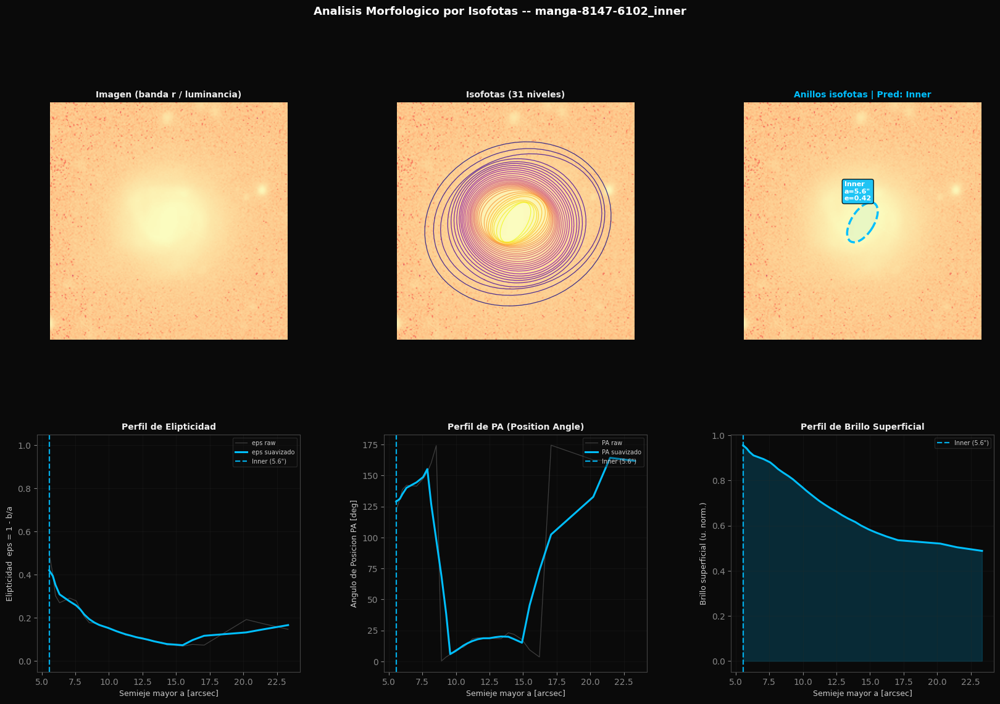


[Isofotas v2] manga-8147-6102_inner | clase: inner | isofotas: 31 | anillos: 1
  Inner   a=5.55"  eps=0.420  PA=128.9deg

  CLASE: OUTER  (339 imagenes disponibles)


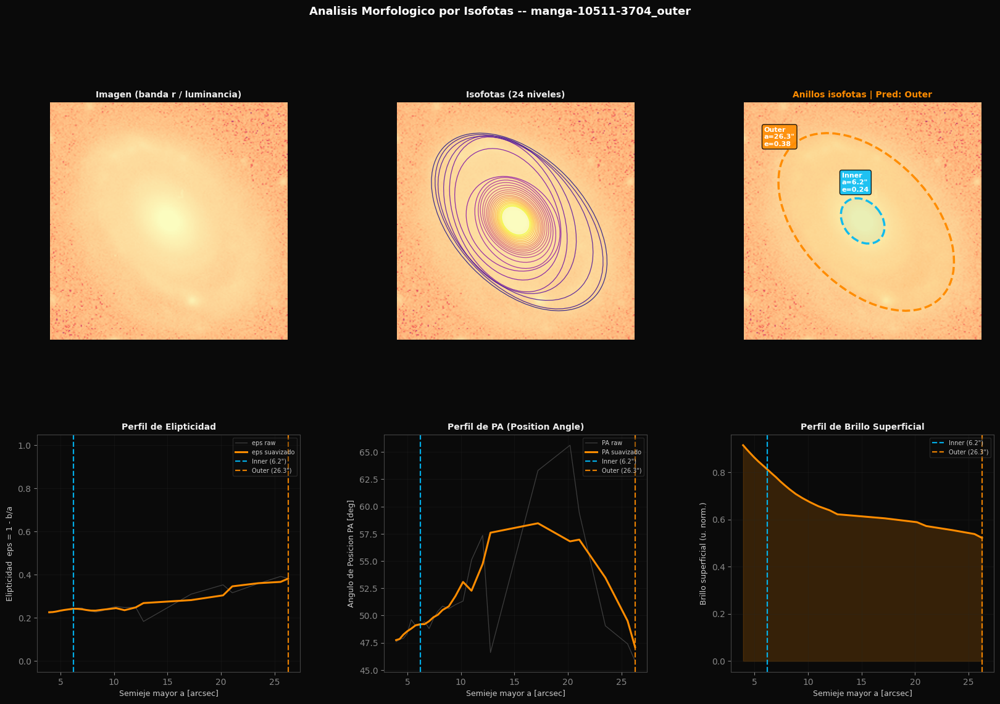


[Isofotas v2] manga-10511-3704_outer | clase: outer | isofotas: 24 | anillos: 2
  Inner   a=6.20"  eps=0.242  PA=49.2deg
  Outer   a=26.26"  eps=0.382  PA=47.1deg

  CLASE: INNER+OUTER  (407 imagenes disponibles)


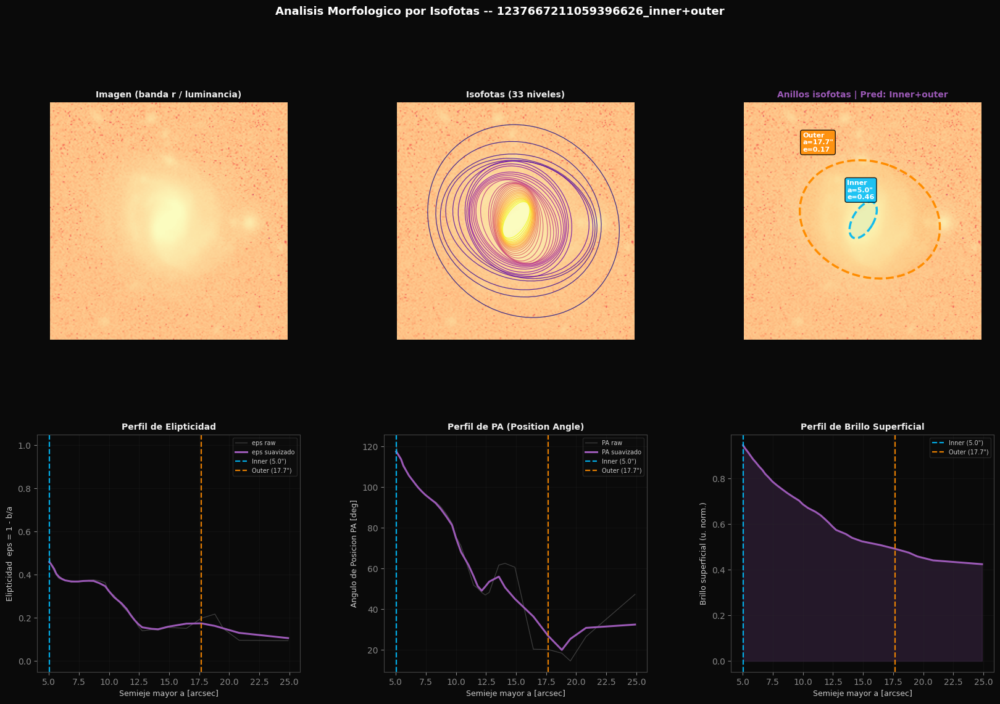


[Isofotas v2] 1237667211059396626_inner+outer | clase: inner+outer | isofotas: 33 | anillos: 2
  Inner   a=5.02"  eps=0.459  PA=117.4deg
  Outer   a=17.68"  eps=0.174  PA=26.7deg


In [26]:
# ============================================================
# Demo: Analisis por isofotas sobre muestras del val set
# ============================================================
# Muestra N_SAMPLES_PER_CLASS galaxias por clase.
# Cambia a analyze_galaxy_isophotes_fits() para mayor precision
# cuando los FITS esten disponibles.
# ============================================================

N_SAMPLES_PER_CLASS = 1   # <- aumentar para ver mas muestras

for cls_name in RING_TYPE:
    cls_dir = DATA_DIR / cls_name
    imgs = sorted(cls_dir.glob("*.png"))
    if not imgs:
        print(f"[{cls_name}] Sin imagenes en {cls_dir}")
        continue

    samples = random.sample(imgs, min(N_SAMPLES_PER_CLASS, len(imgs)))
    print(f"\n{'='*60}")
    print(f"  CLASE: {cls_name.upper()}  ({len(imgs)} imagenes disponibles)")
    print("=" * 60)

    for png_path in samples:
        # Opcion A: analizar desde PNG (siempre disponible)
        result = analyze_galaxy_isophotes_png(png_path, cls_name)

        # Opcion B: analizar desde FITS si existe (mas preciso, banda r)
        # fits_stem = png_path.stem.replace(f"_{cls_name}", "")
        # fits_path = FITS_DR10_DIR / f"{fits_stem}_grz.fits"
        # if fits_path.exists():
        #     result = analyze_galaxy_isophotes_fits(fits_path, cls_name)
        # else:
        #     result = analyze_galaxy_isophotes_png(png_path, cls_name)


---
# Parte 15: Fusión ML + Análisis Morfológico — Detección Combinada

## Motivación

Cada método individual tiene fortalezas y debilidades complementarias:

| Método | Fortaleza | Debilidad |
|--------|-----------|----------|
| **ML (Zoobot)** | Clasificación global robusta (inner/outer/both) | No localiza con precisión; no mide morfología real |
| **detect_rings_v5** | Localización por perfil radial + ajuste de elipse | Depende de picos en el perfil; puede fallar en anillos tenues |
| **Isofotas** | Análisis estructural riguroso (eps, PA, SB profiles) | Sensible a compañeros y contaminación; no tiene contexto semántico |

La **fusión** combina los tres canales:

1. El **ML decide la clase** (inner / outer / inner+outer) y provee confianza
2. `detect_rings_v5` **propone radios candidatos** validados por uniformidad azimutal
3. Las **isofotas refinan** los parámetros geométricos (semi_a, semi_b, PA, eps) y aportan evidencia independiente
4. Un **score combinado** pondera todo en un índice de confianza final por anillo

### Score combinado por anillo

$$S_{\text{ring}} = w_{\text{ml}} \cdot P_{\text{class}} + w_{\text{morph}} \cdot (1 - \text{cv}_{\text{az}}) + w_{\text{iso}} \cdot \text{eps}_{\text{iso}} \cdot \mathbb{1}_{\text{match}}$$

Donde:
- $P_{\text{class}}$: probabilidad ML de la clase predicha
- $\text{cv}_{\text{az}}$: coeficiente de variación azimutal (bajo = más uniforme = más anillo)
- $\text{eps}_{\text{iso}}$: elipticidad de la isofota coincidente (pico de eps = evidencia de anillo)
- $\mathbb{1}_{\text{match}}$: indicador de que la isofota confirma el radio (match dentro de tolerancia)

Los pesos default son `w_ml=0.45, w_morph=0.30, w_iso=0.25` y son configurables.

## 15.1 Funciones de fusión

In [27]:
# ============================================================
# Parte 15.1 — Fusión ML + Morfología + Isofotas
# ============================================================
# Combina las tres fuentes de información en un resultado unificado
# con score de confianza combinado por anillo detectado.
# ============================================================

def find_isophote_match(ring_radius_px, df_iso, tolerance_frac=0.20):
    """
    Busca en la tabla de isofotas la entrada cuyo semi_a está
    más cerca de ring_radius_px, dentro de una tolerancia.

    Retorna dict con eps, pa, sb, semi_a, semi_b, angle del match,
    o None si no hay match dentro de tolerancia.
    """
    if df_iso is None or df_iso.empty:
        return None

    sma = df_iso["semi_a"].values
    distances = np.abs(sma - ring_radius_px)
    best_idx = int(np.argmin(distances))
    tol = max(5, ring_radius_px * tolerance_frac)

    if distances[best_idx] > tol:
        return None

    row = df_iso.iloc[best_idx]
    eps_col = "eps_smooth" if "eps_smooth" in df_iso.columns else "ellipticity"
    pa_col  = "pa_smooth"  if "pa_smooth"  in df_iso.columns else "pa_deg"

    return {
        "semi_a":      float(row["semi_a"]),
        "semi_b":      float(row["semi_b"]),
        "angle_deg":   float(row["angle_deg"]),
        "ellipticity": float(row[eps_col]),
        "pa_deg":      float(row[pa_col]),
        "sb":          float(row["sb"]),
        "sma_arcsec":  float(row["sma_arcsec"]),
        "distance_px": float(distances[best_idx]),
    }


def compute_ring_score(ml_confidence, az_cv=None, iso_match=None,
                       w_ml=0.45, w_morph=0.30, w_iso=0.25):
    """
    Score combinado de confianza para un anillo.

    Componentes:
      - ML:   ml_confidence (0-1)
      - Morph: 1 - cv_azimutal (0-1, alto = uniforme = anillo real)
      - Iso:  ellipticity de isofota coincidente × indicador de match

    Retorna dict con score total + desglose.
    """
    # ML component
    s_ml = float(ml_confidence)

    # Morphological component (azimuthal uniformity)
    if az_cv is not None:
        s_morph = float(np.clip(1.0 - az_cv, 0, 1))
    else:
        s_morph = 0.5  # neutral si no hay info

    # Isophote component
    if iso_match is not None:
        # eps alto en la isofota = evidencia de estructura de anillo
        s_iso = float(np.clip(iso_match["ellipticity"] * 2.5, 0, 1))
        iso_confirmed = True
    else:
        s_iso = 0.0
        iso_confirmed = False

    total = w_ml * s_ml + w_morph * s_morph + w_iso * s_iso

    return {
        "score":          float(np.clip(total, 0, 1)),
        "s_ml":           s_ml,
        "s_morph":        s_morph,
        "s_iso":          s_iso,
        "iso_confirmed":  iso_confirmed,
        "weights":        {"ml": w_ml, "morph": w_morph, "iso": w_iso},
    }


def fuse_ring_parameters(ring_v5, iso_match, prefer_iso_geometry=True):
    """
    Combina los parámetros geométricos del anillo de detect_rings_v5
    con los de la isofota más cercana.

    Si prefer_iso_geometry=True y hay match, usa la geometría de la
    isofota (más precisa porque viene de ajuste a contornos reales).
    Si no, promedia ponderado.
    """
    result = {
        "type":       ring_v5["type"],
        "radius_px":  ring_v5["radius_px"],
        "detected":   ring_v5.get("detected", True),
        "source":     "v5_only",
    }

    if iso_match is None:
        # Solo info de v5
        result["semi_a"]   = ring_v5["semi_a"]
        result["semi_b"]   = ring_v5["semi_b"]
        result["angle"]    = ring_v5["angle"]
        return result

    result["source"] = "fused"

    if prefer_iso_geometry:
        # Usar geometría de isofota (más precisa), radio de v5
        result["semi_a"]      = iso_match["semi_a"]
        result["semi_b"]      = iso_match["semi_b"]
        result["angle"]       = iso_match["angle_deg"]
        result["sma_arcsec"]  = iso_match["sma_arcsec"]
        result["ellipticity"] = iso_match["ellipticity"]
        result["pa_deg"]      = iso_match["pa_deg"]
        result["sb"]          = iso_match["sb"]
    else:
        # Promedio ponderado (v5: 0.4, iso: 0.6)
        w_v5, w_iso = 0.4, 0.6
        result["semi_a"] = w_v5 * ring_v5["semi_a"] + w_iso * iso_match["semi_a"]
        result["semi_b"] = w_v5 * ring_v5["semi_b"] + w_iso * iso_match["semi_b"]
        # Ángulos requieren media circular
        a1 = np.radians(ring_v5["angle"] * 2)
        a2 = np.radians(iso_match["angle_deg"] * 2)
        mean_angle = np.degrees(np.arctan2(
            w_v5 * np.sin(a1) + w_iso * np.sin(a2),
            w_v5 * np.cos(a1) + w_iso * np.cos(a2)
        )) / 2
        result["angle"] = float(mean_angle % 180)
        result["ellipticity"] = iso_match["ellipticity"]
        result["pa_deg"]      = iso_match["pa_deg"]
        result["sb"]          = iso_match["sb"]

    return result


def combined_ring_analysis(model, img_path, df_iso=None,
                            w_ml=0.45, w_morph=0.30, w_iso=0.25,
                            prefer_iso_geometry=True,
                            run_isophotes=True):
    """
    Pipeline completo de detección combinada ML + Morfología + Isofotas.

    Parámetros
    ----------
    model             : ZoobotRingSubclassifier cargado
    img_path          : Path al PNG de la galaxia
    df_iso            : DataFrame de isofotas pre-calculado (None = calcular)
    w_ml, w_morph, w_iso : pesos del score combinado
    prefer_iso_geometry   : usar geometría de isofota cuando hay match
    run_isophotes         : si True y df_iso=None, ejecuta el pipeline de isofotas

    Retorna
    -------
    dict con:
      - class, confidence, probs: resultado ML
      - rings_fused: lista de anillos con parámetros fusionados + score
      - rings_v5: anillos originales de detect_rings_v5
      - rings_iso: anillos detectados por isofotas (si aplica)
      - bar: info de barra (si detectada)
      - df_iso: tabla de isofotas
      - center: (cy, cx)
      - verdict: clasificación de confianza (high/medium/low/conflict)
    """
    model.eval()
    img     = Image.open(img_path).convert("RGB")
    img_rgb = np.array(img)
    tensor  = val_transform(img).unsqueeze(0).to(model.device)

    # ── 1. Predicción ML ──────────────────────────────────────────────────
    with torch.no_grad():
        output = model(tensor)
        probs  = F.softmax(output, dim=1).cpu().numpy()[0]
        pred_idx   = int(np.argmax(probs))
        pred_class = RING_TYPE[pred_idx]
        confidence = float(probs[pred_idx])

    # ── 2. Detección morfológica v5 ───────────────────────────────────────
    rings_v5, (cy, cx) = detect_rings_v5(img_rgb, pred_class)

    # ── 3. Detección de barra ─────────────────────────────────────────────
    gray_f   = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0
    smoothed = gaussian(gray_f, sigma=2.0)
    max_r    = min(cy, cx, img_rgb.shape[0] - cy, img_rgb.shape[1] - cx)
    bar_info = detect_bar_improved(smoothed, (cy, cx), max_r)

    # ── 4. Análisis por isofotas ──────────────────────────────────────────
    rings_iso = []
    if df_iso is None and run_isophotes:
        gray_lum = _load_gray_from_png(img_path)
        df_iso = compute_isophote_ellipses(gray_lum)
        df_iso = compute_ellipticity_profile(df_iso)
        h, w = gray_lum.shape
        rings_iso = detect_ring_from_isophotes(df_iso, pred_class, h, w)
    elif df_iso is not None:
        h, w = img_rgb.shape[:2]
        rings_iso = detect_ring_from_isophotes(df_iso, pred_class, h, w)

    # ── 5. Fusión por anillo ──────────────────────────────────────────────
    rings_fused = []
    for ring in rings_v5:
        rpx = ring["radius_px"]

        # Buscar match en isofotas
        iso_match = find_isophote_match(rpx, df_iso) if df_iso is not None else None

        # Fusionar parámetros geométricos
        fused = fuse_ring_parameters(ring, iso_match, prefer_iso_geometry)

        # Calcular score combinado
        az_cv = ring.get("az_cv", None)
        score_info = compute_ring_score(
            confidence, az_cv=az_cv, iso_match=iso_match,
            w_ml=w_ml, w_morph=w_morph, w_iso=w_iso
        )
        fused["score_info"] = score_info
        fused["score"]      = score_info["score"]
        fused["iso_match"]  = iso_match

        rings_fused.append(fused)

    # ── 6. Verificar anillos de isofotas sin match en v5 ──────────────────
    # Si las isofotas detectaron un anillo que v5 no encontró, agregarlo
    # como candidato extra con penalización en score
    for iso_ring in rings_iso:
        r_iso = iso_ring["semi_a_px"]
        has_match = any(
            abs(rf["radius_px"] - r_iso) < max(8, r_iso * 0.25)
            for rf in rings_fused
        )
        if not has_match:
            # Anillo solo por isofotas — agregar con score reducido
            extra = {
                "type":       iso_ring["type"],
                "radius_px":  int(r_iso),
                "semi_a":     iso_ring["semi_a_px"],
                "semi_b":     iso_ring["semi_b_px"],
                "angle":      iso_ring["angle_deg"],
                "detected":   False,
                "source":     "iso_only",
                "ellipticity": iso_ring["ellipticity"],
                "pa_deg":     iso_ring["pa_deg"],
                "sb":         iso_ring["sb"],
                "sma_arcsec": iso_ring["sma_arcsec"],
            }
            score_info = compute_ring_score(
                confidence, az_cv=None,
                iso_match={"ellipticity": iso_ring["ellipticity"]},
                w_ml=w_ml * 0.6,  # penalizar: ML no respalda directamente
                w_morph=0.0,
                w_iso=w_iso * 1.5,
            )
            extra["score_info"] = score_info
            extra["score"]      = score_info["score"]
            extra["iso_match"]  = None
            rings_fused.append(extra)

    rings_fused.sort(key=lambda r: r["radius_px"])

    # ── 7. Veredicto global ───────────────────────────────────────────────
    if not rings_fused:
        verdict = "no_rings"
    else:
        avg_score = np.mean([r["score"] for r in rings_fused])
        n_iso_confirmed = sum(1 for r in rings_fused
                              if r.get("score_info", {}).get("iso_confirmed", False))
        n_fused_sources = sum(1 for r in rings_fused if r.get("source") == "fused")

        if avg_score >= 0.65 and confidence >= 0.70 and n_iso_confirmed > 0:
            verdict = "high_confidence"
        elif avg_score >= 0.45 and confidence >= 0.50:
            verdict = "medium_confidence"
        elif n_fused_sources == 0 and n_iso_confirmed == 0:
            verdict = "low_confidence"
        else:
            verdict = "mixed_evidence"

    return {
        "class":       pred_class,
        "confidence":  confidence,
        "probs":       probs,
        "rings_fused": rings_fused,
        "rings_v5":    rings_v5,
        "rings_iso":   rings_iso,
        "bar":         bar_info,
        "df_iso":      df_iso,
        "center":      (cy, cx),
        "verdict":     verdict,
    }


print("Funciones de fusión ML + Morfología cargadas")
print("  + find_isophote_match()")
print("  + compute_ring_score()")
print("  + fuse_ring_parameters()")
print("  + combined_ring_analysis()")


Funciones de fusión ML + Morfología cargadas
  + find_isophote_match()
  + compute_ring_score()
  + fuse_ring_parameters()
  + combined_ring_analysis()


## 15.2 Visualización combinada — Panel de 5 subplots

In [28]:
# ============================================================
# Parte 15.2 — Visualización combinada ML + Morfología + Isofotas
# ============================================================

def _score_color(score):
    """Color del score: verde (alto) → amarillo (medio) → rojo (bajo)."""
    if score >= 0.65:
        return "#2ecc71"
    elif score >= 0.45:
        return "#f39c12"
    else:
        return "#e74c3c"


def _verdict_emoji(verdict):
    """Icono de texto para el veredicto."""
    return {
        "high_confidence":   "★★★ Alta confianza",
        "medium_confidence": "★★☆ Confianza media",
        "low_confidence":    "★☆☆ Baja confianza",
        "mixed_evidence":    "⚠ Evidencia mixta",
        "no_rings":          "✗ Sin anillos",
    }.get(verdict, verdict)


def visualize_combined_analysis(result, img_path, save_path=None):
    """
    Panel de 5 subplots para análisis combinado:

      [0] Imagen original
      [1] Anillos fusionados (elipses con score)
      [2] Probabilidades ML + veredicto
      [3] Comparación v5 vs isofotas vs fusionado
      [4] Desglose de score por anillo (barras apiladas)

    Parámetros
    ----------
    result   : dict de combined_ring_analysis()
    img_path : Path al PNG original
    """
    img = np.array(Image.open(img_path).convert("RGB"))
    h, w = img.shape[:2]
    cy, cx = result["center"]
    rings  = result["rings_fused"]
    pred_class = result["class"]
    confidence = result["confidence"]
    probs      = result["probs"]
    verdict    = result["verdict"]
    bar_info   = result["bar"]

    ring_colors = {"Inner": "#00BFFF", "Outer": "#FF8C00"}
    cls_colors  = {"inner": "#00BFFF", "outer": "#FF8C00", "inner+outer": "#9b59b6"}
    main_color  = cls_colors.get(pred_class, "#AAAAAA")

    fig = plt.figure(figsize=(28, 6.5))
    gs = gridspec.GridSpec(1, 5, figure=fig, wspace=0.35,
                           width_ratios=[1, 1.2, 0.8, 1, 0.9])

    # ── [0] Original ─────────────────────────────────────────────────────
    ax0 = fig.add_subplot(gs[0])
    ax0.imshow(img)
    ax0.axis("off")
    ax0.set_title("Original", fontsize=11, fontweight="bold")

    # ── [1] Anillos fusionados ───────────────────────────────────────────
    ax1 = fig.add_subplot(gs[1])
    ax1.imshow(img)
    ax1.plot(cx, cy, "r+", markersize=14, markeredgewidth=2)

    for ring in rings:
        rtype = ring["type"]
        color = ring_colors.get(rtype, "#FFFF00")
        score = ring.get("score", 0)
        src   = ring.get("source", "?")
        det   = ring.get("detected", True)

        # Estilo según fuente
        if src == "fused":
            ls, lw = "-", 3.0
        elif src == "iso_only":
            ls, lw = ":", 2.0
        else:
            ls, lw = "--" if not det else "-", 2.5

        ep = Ellipse(
            xy=(cx, cy),
            width=ring["semi_a"] * 2, height=ring["semi_b"] * 2,
            angle=ring.get("angle", 0),
            fill=False, edgecolor=color, linewidth=lw, linestyle=ls
        )
        ax1.add_patch(ep)
        ef = Ellipse(
            xy=(cx, cy),
            width=ring["semi_a"] * 2, height=ring["semi_b"] * 2,
            angle=ring.get("angle", 0),
            fill=True, facecolor=color, alpha=0.07
        )
        ax1.add_patch(ef)

        # Etiqueta con score
        lbl_y = cy - ring["semi_b"] - 12
        sc_color = _score_color(score)
        source_tag = {"fused": "ML+ISO", "v5_only": "ML", "iso_only": "ISO"}.get(src, src)
        ax1.annotate(
            f"{rtype} r={ring['radius_px']}px\n"
            f"Score: {score:.2f} [{source_tag}]",
            xy=(cx, max(5, lbl_y)),
            fontsize=8, color="white", fontweight="bold",
            ha="center", va="bottom",
            bbox=dict(boxstyle="round,pad=0.3", facecolor=sc_color, alpha=0.90)
        )

    # Barra si existe
    if bar_info is not None:
        gray_f = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0
        smoothed_bar = gaussian(gray_f, sigma=2.0)
        (x1, y1), (x2, y2) = measure_bar_endpoints(smoothed_bar, (cy, cx), bar_info)
        ax1.plot([x1, x2], [y1, y2], color="lime", linewidth=3, alpha=0.85)

    ax1.set_title(
        f"Fusión: {pred_class} ({confidence:.0%})",
        fontsize=13, fontweight="bold", color=main_color
    )
    ax1.axis("off")

    # ── [2] Probabilidades + veredicto ───────────────────────────────────
    ax2 = fig.add_subplot(gs[2])
    colors_bar = ["#3498db", "#e74c3c", "#9b59b6"]
    bars = ax2.barh(RING_TYPE, probs, color=colors_bar)
    ax2.set_xlim(0, 1)
    ax2.set_title("Probabilidades ML", fontsize=11)
    for bar, p in zip(bars, probs):
        ax2.text(bar.get_width() + 0.02, bar.get_y() + bar.get_height() / 2,
                 f"{p:.1%}", va="center", fontweight="bold", fontsize=10)

    # Veredicto abajo del panel
    v_color = {
        "high_confidence": "#2ecc71", "medium_confidence": "#f39c12",
        "low_confidence": "#e74c3c", "mixed_evidence": "#e67e22",
        "no_rings": "#888888"
    }.get(verdict, "#888888")
    ax2.text(0.5, -0.18, _verdict_emoji(verdict),
             transform=ax2.transAxes, ha="center", fontsize=10,
             fontweight="bold", color=v_color,
             bbox=dict(facecolor="white", edgecolor=v_color, alpha=0.9,
                       boxstyle="round,pad=0.4"))

    # ── [3] Comparación radios: v5 vs iso vs fusionado ───────────────────
    ax3 = fig.add_subplot(gs[3])
    ring_types_found = sorted(set(r["type"] for r in rings))

    if ring_types_found:
        # Construir tabla comparativa
        bar_width = 0.25
        y_positions = np.arange(len(ring_types_found))
        labels_done = {"v5": False, "iso": False, "fused": False}

        for i, rtype in enumerate(ring_types_found):
            # v5
            v5_rings = [r for r in result["rings_v5"] if r.get("type") == rtype]
            r_v5 = v5_rings[0]["radius_px"] if v5_rings else 0

            # iso
            iso_rings = [r for r in result["rings_iso"]
                         if r.get("type") == rtype]
            r_iso = int(iso_rings[0]["semi_a_px"]) if iso_rings else 0

            # fused
            fused_rings = [r for r in rings if r["type"] == rtype]
            r_fused = fused_rings[0]["radius_px"] if fused_rings else 0

            color = ring_colors.get(rtype, "#FFFF00")

            lbl_v5    = "detect_rings_v5" if not labels_done["v5"] else ""
            lbl_iso   = "Isofotas" if not labels_done["iso"] else ""
            lbl_fused = "Fusionado" if not labels_done["fused"] else ""

            ax3.barh(i - bar_width, r_v5, bar_width, color=color,
                     alpha=0.4, edgecolor=color, label=lbl_v5)
            ax3.barh(i, r_iso, bar_width, color=color,
                     alpha=0.65, edgecolor=color, hatch="//", label=lbl_iso)
            ax3.barh(i + bar_width, r_fused, bar_width, color=color,
                     alpha=1.0, edgecolor="white", linewidth=1.5, label=lbl_fused)

            # Anotar valores
            for val, yp in [(r_v5, i - bar_width), (r_iso, i), (r_fused, i + bar_width)]:
                if val > 0:
                    ax3.text(val + 1, yp, f"{val}px", va="center", fontsize=8)

            labels_done = {"v5": True, "iso": True, "fused": True}

        ax3.set_yticks(y_positions)
        ax3.set_yticklabels(ring_types_found)
        ax3.set_xlabel("Radio (px)")
        ax3.set_title("Comparación de radios", fontsize=11, fontweight="bold")
        ax3.legend(fontsize=7, loc="lower right")
        ax3.grid(True, alpha=0.3, axis="x")
    else:
        ax3.text(0.5, 0.5, "Sin anillos\ndetectados", ha="center", va="center",
                 fontsize=11, transform=ax3.transAxes, color="#888888")
        ax3.set_title("Comparación de radios", fontsize=11)

    # ── [4] Desglose de score ────────────────────────────────────────────
    ax4 = fig.add_subplot(gs[4])
    if rings:
        labels = [f"{r['type']}\nr={r['radius_px']}px" for r in rings]
        y_pos = np.arange(len(rings))
        s_ml_vals    = [r["score_info"]["s_ml"]    * r["score_info"]["weights"]["ml"]    for r in rings]
        s_morph_vals = [r["score_info"]["s_morph"] * r["score_info"]["weights"]["morph"] for r in rings]
        s_iso_vals   = [r["score_info"]["s_iso"]   * r["score_info"]["weights"]["iso"]   for r in rings]

        ax4.barh(y_pos, s_ml_vals, color="#3498db", label="ML")
        ax4.barh(y_pos, s_morph_vals, left=s_ml_vals, color="#2ecc71", label="Morph")
        left2 = [a + b for a, b in zip(s_ml_vals, s_morph_vals)]
        ax4.barh(y_pos, s_iso_vals, left=left2, color="#e67e22", label="Iso")

        # Anotar score total
        for i, ring in enumerate(rings):
            total = ring["score"]
            ax4.text(total + 0.02, i, f"{total:.2f}",
                     va="center", fontweight="bold", fontsize=10,
                     color=_score_color(total))

        ax4.set_yticks(y_pos)
        ax4.set_yticklabels(labels, fontsize=8)
        ax4.set_xlim(0, 1.15)
        ax4.set_title("Score combinado", fontsize=11, fontweight="bold")
        ax4.legend(fontsize=7, loc="lower right")
        ax4.grid(True, alpha=0.3, axis="x")
    else:
        ax4.text(0.5, 0.5, "N/A", ha="center", va="center",
                 fontsize=11, transform=ax4.transAxes)

    # Título global
    fname = Path(img_path).stem[:45]
    fig.suptitle(
        f"{fname}  —  Análisis Combinado ML + Morfología",
        fontsize=13, fontweight="bold", y=1.02
    )
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, bbox_inches="tight", dpi=130)
    plt.show()


print("Visualización combinada cargada: visualize_combined_analysis()")


Visualización combinada cargada: visualize_combined_analysis()


## 15.3 Demo — Análisis combinado sobre muestras del dataset

  ANÁLISIS COMBINADO ML + MORFOLOGÍA + ISOFOTAS

────────────────────────────────────────────────────────────
  Clase: INNER  (1263 imágenes)
────────────────────────────────────────────────────────────


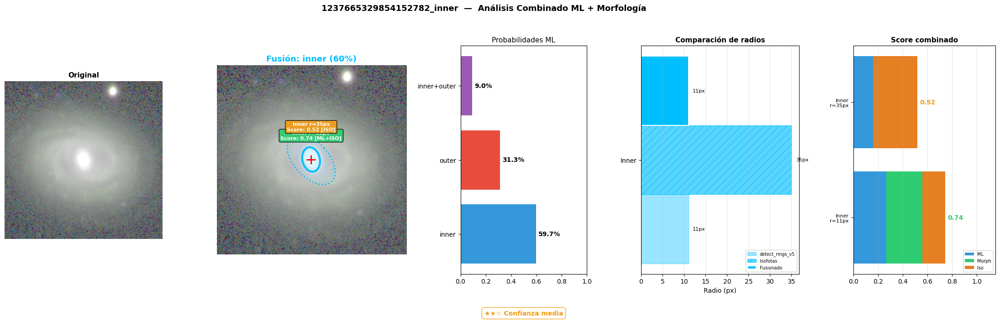


  📌 1237665329854152782_inner
     ML: inner (59.7%)
     Veredicto: ★★☆ Confianza media
     Inner  r=11px  Score=0.74  [ML+ISO] [detectado] [✓ ISO]
     Inner  r=35px  Score=0.52  [ISO only] [estimado] [✓ ISO]


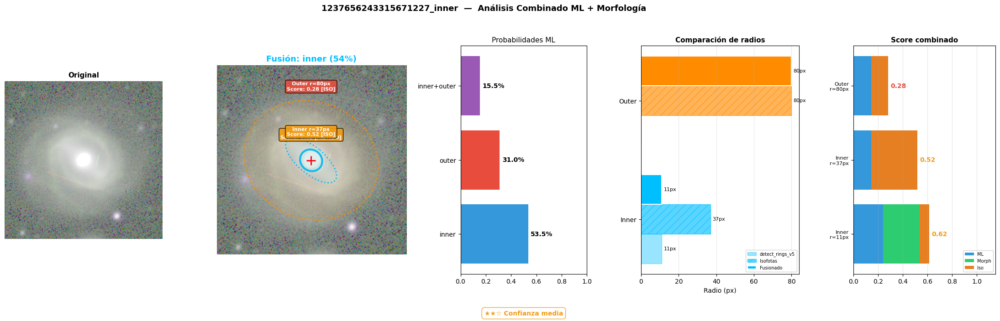


  📌 1237656243315671227_inner
     ML: inner (53.5%)
     Veredicto: ★★☆ Confianza media
     Inner  r=11px  Score=0.62  [ML+ISO] [detectado] [✓ ISO]
     Inner  r=37px  Score=0.52  [ISO only] [estimado] [✓ ISO]
     Outer  r=80px  Score=0.28  [ISO only] [estimado] [✓ ISO]

────────────────────────────────────────────────────────────
  Clase: OUTER  (339 imágenes)
────────────────────────────────────────────────────────────


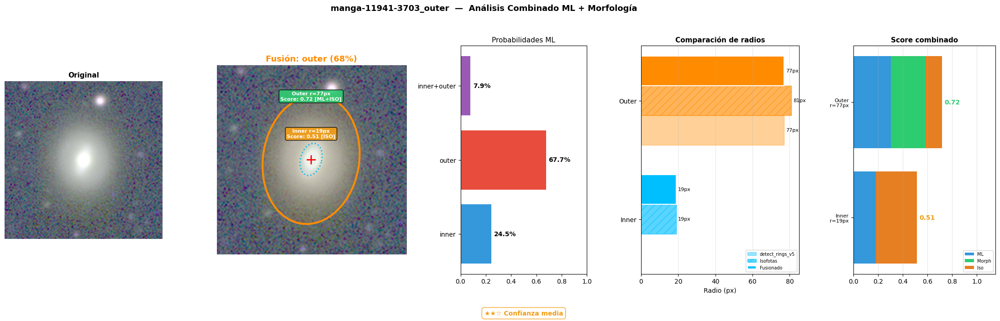


  📌 manga-11941-3703_outer
     ML: outer (67.7%)
     Veredicto: ★★☆ Confianza media
     Inner  r=19px  Score=0.51  [ISO only] [estimado] [✓ ISO]
     Outer  r=77px  Score=0.72  [ML+ISO] [detectado] [✓ ISO]


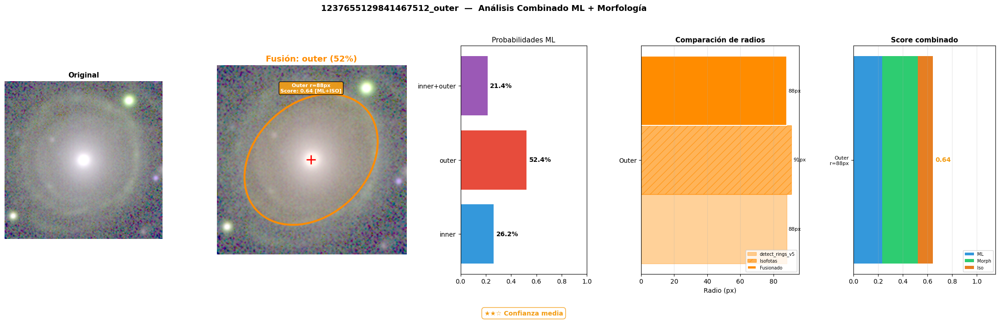


  📌 1237655129841467512_outer
     ML: outer (52.4%)
     Veredicto: ★★☆ Confianza media
     Outer  r=88px  Score=0.64  [ML+ISO] [detectado] [✓ ISO]

────────────────────────────────────────────────────────────
  Clase: INNER+OUTER  (407 imágenes)
────────────────────────────────────────────────────────────


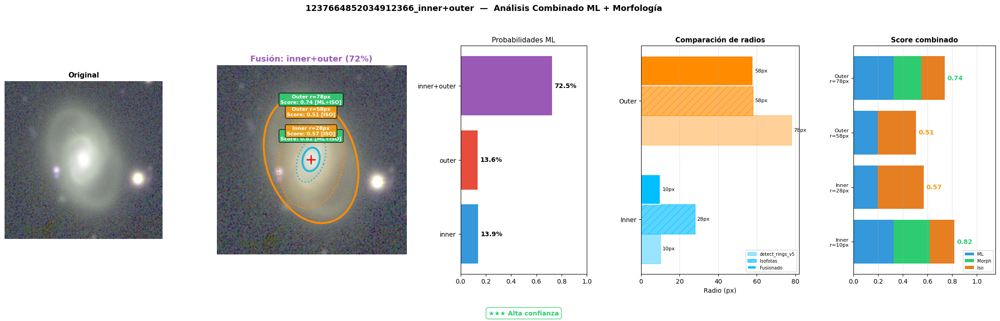


  📌 1237664852034912366_inner+outer
     ML: inner+outer (72.5%)
     Veredicto: ★★★ Alta confianza
     Inner  r=10px  Score=0.82  [ML+ISO] [detectado] [✓ ISO]
     Inner  r=28px  Score=0.57  [ISO only] [estimado] [✓ ISO]
     Outer  r=58px  Score=0.51  [ISO only] [estimado] [✓ ISO]
     Outer  r=78px  Score=0.74  [ML+ISO] [detectado] [✓ ISO]


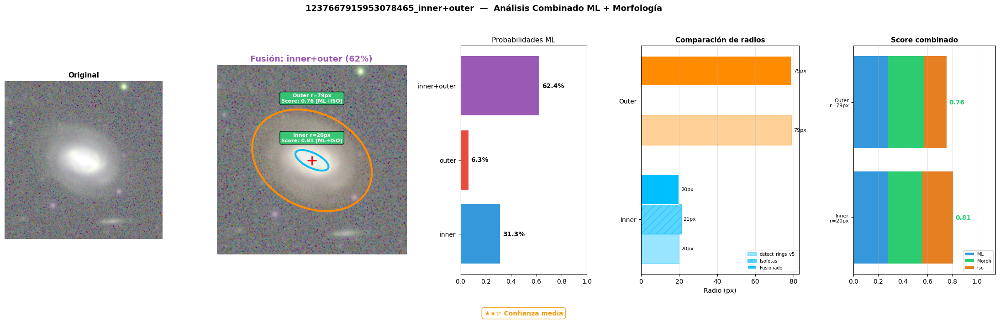


  📌 1237667915953078465_inner+outer
     ML: inner+outer (62.4%)
     Veredicto: ★★☆ Confianza media
     Inner  r=20px  Score=0.81  [ML+ISO] [detectado] [✓ ISO]
     Outer  r=79px  Score=0.76  [ML+ISO] [detectado] [✓ ISO]


  RESUMEN ESTADÍSTICO
  ★★★ Alta confianza            : 1 galaxias
  ★★☆ Confianza media           : 5 galaxias

  Score medio de anillos: 0.625 (±0.145)
  Score mínimo: 0.283  Máximo: 0.819

  Anillos fusionados (ML+ISO): 8
  Anillos solo ML (v5):        0
  Anillos solo isofotas:       6


In [29]:
# ============================================================
# Demo: Análisis combinado ML + Morfología + Isofotas
# ============================================================
# Para cada clase, analiza N_SAMPLES galaxias con el pipeline
# completo y muestra el panel de 5 subplots.
# ============================================================

N_SAMPLES_PER_CLASS = 2  # ← aumentar para ver más muestras

print("=" * 70)
print("  ANÁLISIS COMBINADO ML + MORFOLOGÍA + ISOFOTAS")
print("=" * 70)

all_results = []

for cls_name in RING_TYPE:
    cls_dir = DATA_DIR / cls_name
    imgs = sorted(cls_dir.glob("*.png"))
    if not imgs:
        print(f"[{cls_name}] Sin imágenes en {cls_dir}")
        continue

    samples = random.sample(imgs, min(N_SAMPLES_PER_CLASS, len(imgs)))
    print(f"\n{'─'*60}")
    print(f"  Clase: {cls_name.upper()}  ({len(imgs)} imágenes)")
    print(f"{'─'*60}")

    for img_path in samples:
        # Ejecutar pipeline combinado
        result = combined_ring_analysis(model, img_path)

        # Visualizar
        visualize_combined_analysis(result, img_path)

        # Resumen en texto
        print(f"\n  📌 {Path(img_path).stem}")
        print(f"     ML: {result['class']} ({result['confidence']:.1%})")
        print(f"     Veredicto: {_verdict_emoji(result['verdict'])}")

        for r in result["rings_fused"]:
            src_tag = {"fused": "ML+ISO", "v5_only": "ML only",
                       "iso_only": "ISO only"}.get(r.get("source"), "?")
            det_tag = "detectado" if r.get("detected", True) else "estimado"
            iso_tag = "✓ ISO" if r.get("score_info", {}).get("iso_confirmed") else "✗ ISO"
            print(f"     {r['type']:6s} r={r['radius_px']}px  "
                  f"Score={r['score']:.2f}  [{src_tag}] [{det_tag}] [{iso_tag}]")

        if result["bar"]:
            b = result["bar"]
            print(f"     Barra: L={b['length_arcsec']:.1f}\"  "
                  f"PA={b['angle']:.1f}°  eps={b['ellipticity_peak']:.2f}")

        all_results.append(result)

# ── Resumen estadístico ──────────────────────────────────────────────────
print(f"\n\n{'='*70}")
print("  RESUMEN ESTADÍSTICO")
print(f"{'='*70}")

verdicts = [r["verdict"] for r in all_results]
for v in set(verdicts):
    n = verdicts.count(v)
    print(f"  {_verdict_emoji(v):30s}: {n} galaxias")

all_scores = [r["score"] for res in all_results for r in res["rings_fused"]]
if all_scores:
    print(f"\n  Score medio de anillos: {np.mean(all_scores):.3f} "
          f"(±{np.std(all_scores):.3f})")
    print(f"  Score mínimo: {np.min(all_scores):.3f}  "
          f"Máximo: {np.max(all_scores):.3f}")

n_fused = sum(1 for res in all_results for r in res["rings_fused"]
              if r.get("source") == "fused")
n_v5only = sum(1 for res in all_results for r in res["rings_fused"]
               if r.get("source") == "v5_only")
n_isoonly = sum(1 for res in all_results for r in res["rings_fused"]
                if r.get("source") == "iso_only")
print(f"\n  Anillos fusionados (ML+ISO): {n_fused}")
print(f"  Anillos solo ML (v5):        {n_v5only}")
print(f"  Anillos solo isofotas:       {n_isoonly}")
